In [1]:
import numpy as np

In [2]:
from fastai.vision.all import *

In [3]:
import shutil
import os

models_in_train = r'D:\DOWNLOAD FOLDER\Flowers_Classification.v4-youtube.folder\train\models'

if os.path.exists(models_in_train):
    shutil.rmtree(models_in_train)  
    print('Deleted')

print('Classes:', os.listdir(r'D:\DOWNLOAD FOLDER\Flowers_Classification.v4-youtube.folder\train'))

Deleted
Classes: ['daisy', 'dandelion']


In [4]:
src = r'D:\DOWNLOAD FOLDER\Flowers_Classification.v4-youtube.folder\train\models'
dst = r'D:\DOWNLOAD FOLDER\Flowers_Classification.v4-youtube.folder\models'

if os.path.exists(src):
    shutil.move(src, dst)
    print('models folder moved')
else:
    print('already moved')



already moved


In [5]:
print('Classes:', os.listdir(r'D:\DOWNLOAD FOLDER\Flowers_Classification.v4-youtube.folder\train'))

Classes: ['daisy', 'dandelion']


In [6]:
np.random.seed(42)
path = Path(r'D:\DOWNLOAD FOLDER\Flowers_Classification.v4-youtube.folder\train')

dls = ImageDataLoaders.from_folder(
    path,
    valid_pct=0.2,
    seed=42,
    size=224,
    num_workers=0
)

print('Classes:', dls.vocab)
print('Num Classes :', len(dls.vocab))  
print('Train size  :', len(dls.train_ds))
print('Valid size  :', len(dls.valid_ds))

Classes: ['daisy', 'dandelion']
Num Classes : 2
Train size  : 1020
Valid size  : 255


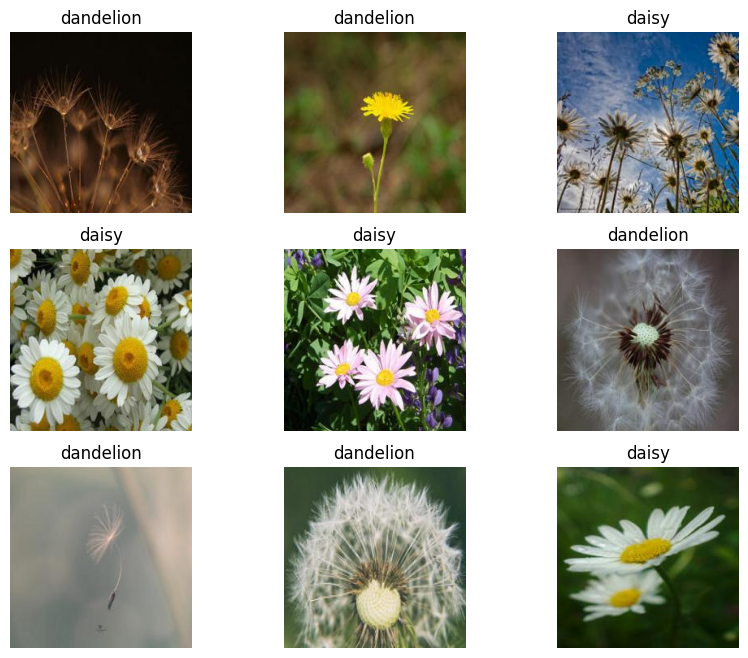

In [7]:
dls.show_batch(nrows=3, figsize=(10, 8))


In [8]:
callbacks = [
    EarlyStoppingCallback(monitor='error_rate', patience=5),
    SaveModelCallback(monitor='error_rate', fname='best_resnet34')
]

learn = vision_learner(dls, resnet34, metrics=error_rate)
print('✅ Model created')

✅ Model created


<div></div>

SuggestedLRs(valley=0.0008317637839354575)

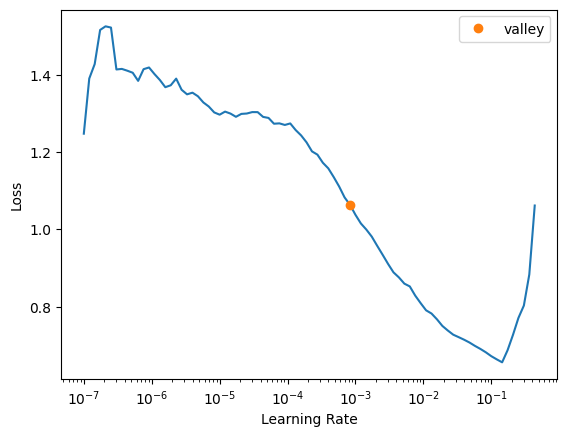

In [9]:
learn.lr_find()

In [10]:

learn.fine_tune(4, cbs=callbacks)

epoch,train_loss,valid_loss,error_rate,time
0,0.675472,0.334272,0.105882,03:53


Better model found at epoch 0 with error_rate value: 0.10588235408067703.


epoch,train_loss,valid_loss,error_rate,time
0,0.239564,0.216784,0.070588,05:28
1,0.163764,0.289271,0.078431,05:23
2,0.115333,0.276236,0.078431,05:28
3,0.077711,0.258954,0.074510,05:23


Better model found at epoch 0 with error_rate value: 0.07058823853731155.


In [11]:
def find_appropriate_lr(model:Learner,ir_different=15,loss_threshold:float=.05,adjust_value:float=1,plot:bool=False)->float:
     model.lr_find()
     losses=np.array(model.recorder.losses)
     min_loss_index=np.argmin(losses)
     lrs=model.recorder.lra
     return lrs[min_loss_index]/10

In [12]:
learn.fit_one_cycle(
    1,
    lr_max=slice(1e-5, 1e-3),  # slice(optimal_lr/10, optimal_lr)
    cbs=callbacks
)

epoch,train_loss,valid_loss,error_rate,time
0,0.058215,0.267617,0.078431,05:27


Better model found at epoch 0 with error_rate value: 0.0784313753247261.


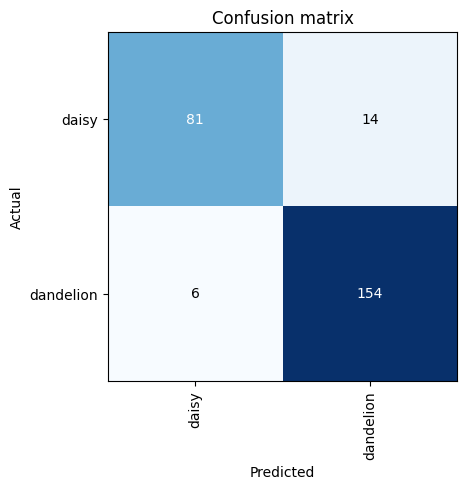

In [13]:
interp=ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()


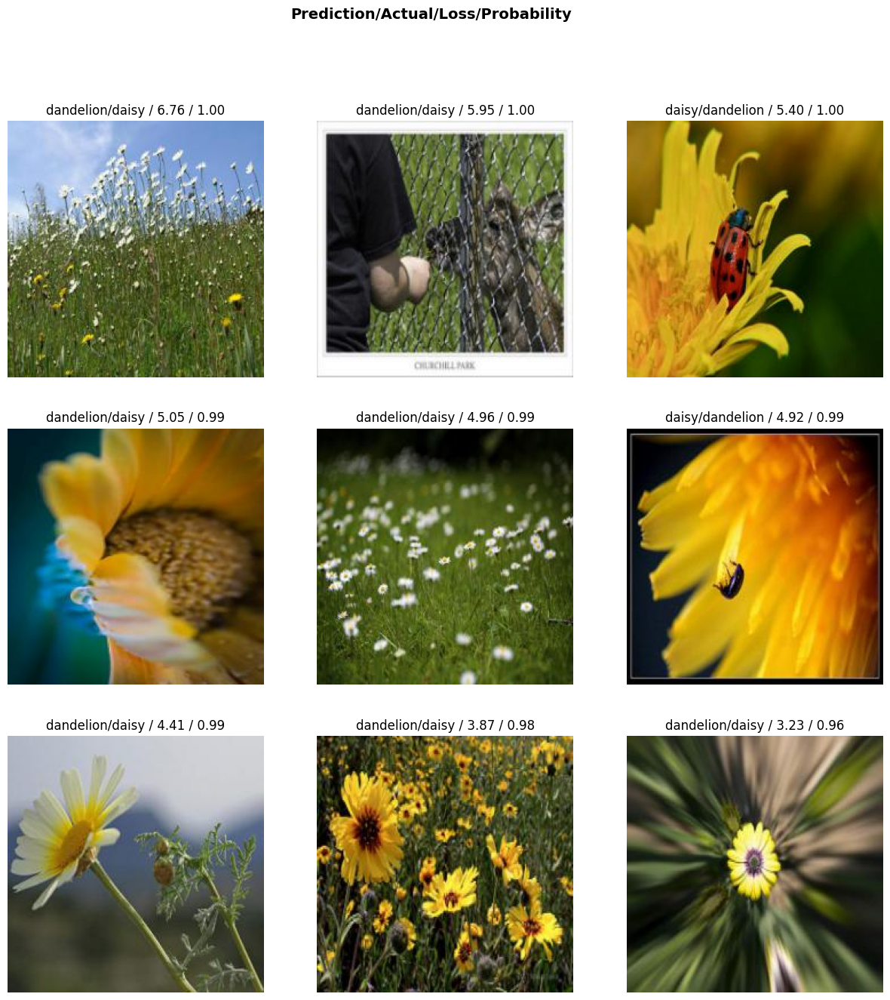

In [14]:
interp.plot_top_losses(9,figsize=(15,15))

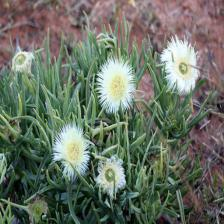

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


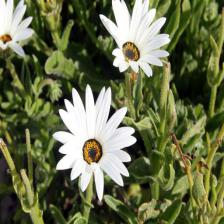

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


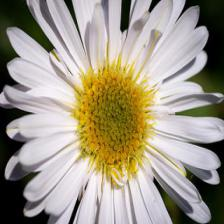

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


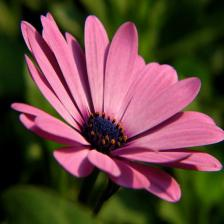

Actual    : daisy
Predicted : daisy
Confidence: 99.99%
----------------------------------------


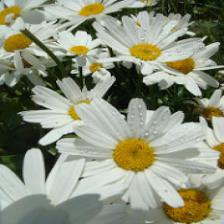

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


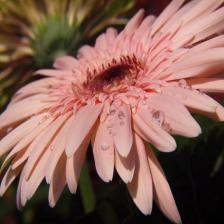

Actual    : daisy
Predicted : daisy
Confidence: 58.80%
----------------------------------------


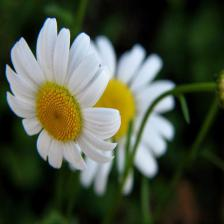

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


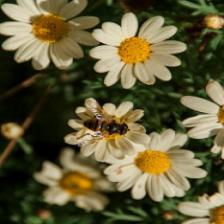

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


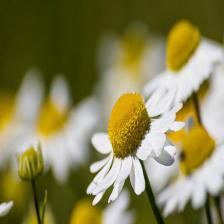

Actual    : daisy
Predicted : daisy
Confidence: 99.83%
----------------------------------------


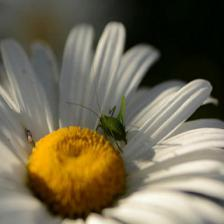

Actual    : daisy
Predicted : daisy
Confidence: 99.98%
----------------------------------------


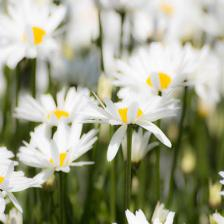

Actual    : daisy
Predicted : daisy
Confidence: 99.94%
----------------------------------------


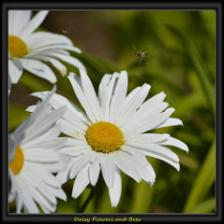

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


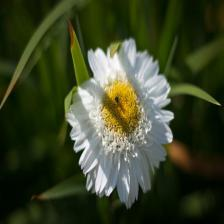

Actual    : daisy
Predicted : daisy
Confidence: 97.48%
----------------------------------------


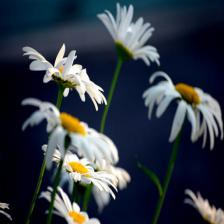

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


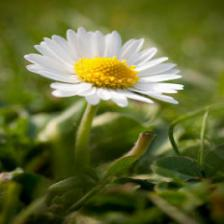

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


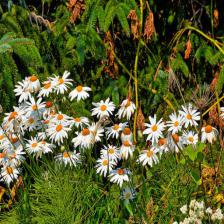

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


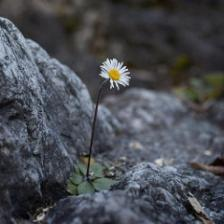

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


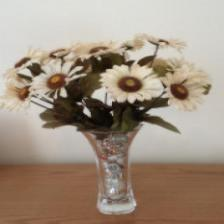

Actual    : daisy
Predicted : dandelion
Confidence: 65.79%
----------------------------------------


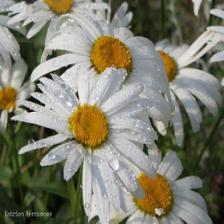

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


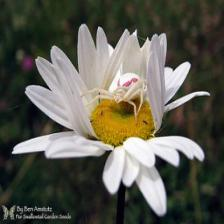

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


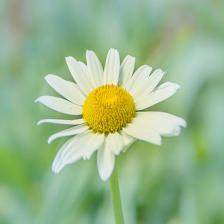

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


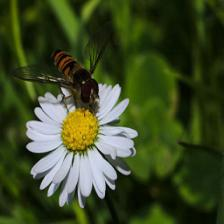

Actual    : daisy
Predicted : daisy
Confidence: 99.95%
----------------------------------------


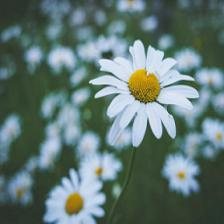

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


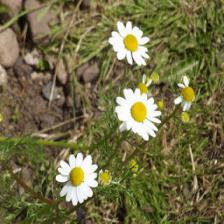

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


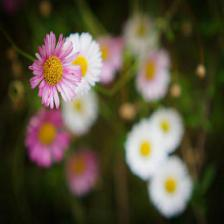

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


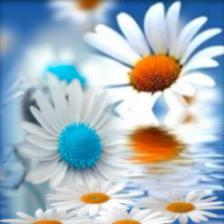

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


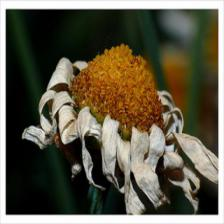

Actual    : daisy
Predicted : daisy
Confidence: 99.94%
----------------------------------------


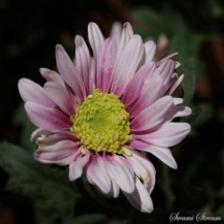

Actual    : daisy
Predicted : daisy
Confidence: 99.99%
----------------------------------------


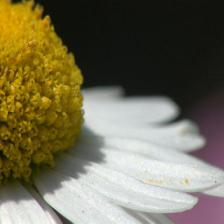

Actual    : daisy
Predicted : daisy
Confidence: 80.76%
----------------------------------------


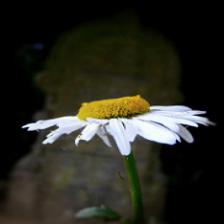

Actual    : daisy
Predicted : daisy
Confidence: 99.99%
----------------------------------------


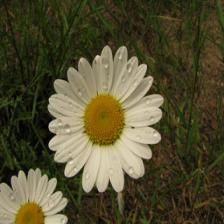

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


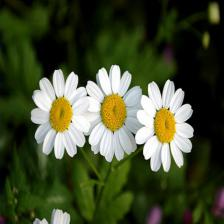

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


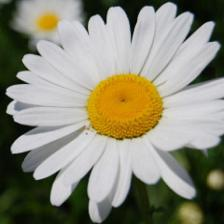

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


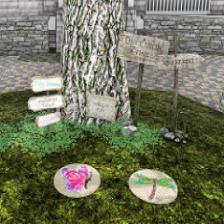

Actual    : daisy
Predicted : daisy
Confidence: 91.70%
----------------------------------------


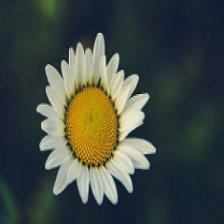

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


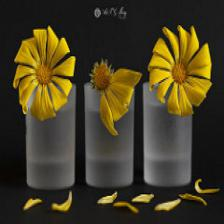

Actual    : daisy
Predicted : daisy
Confidence: 57.08%
----------------------------------------


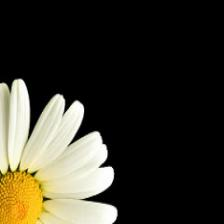

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


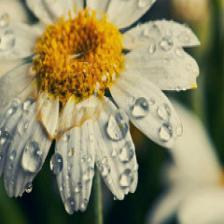

Actual    : daisy
Predicted : daisy
Confidence: 99.94%
----------------------------------------


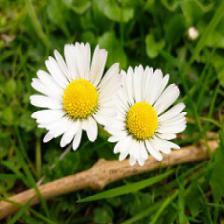

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


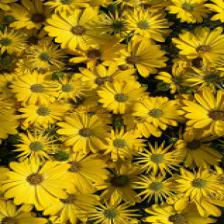

Actual    : daisy
Predicted : dandelion
Confidence: 93.99%
----------------------------------------


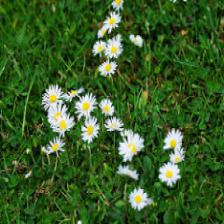

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


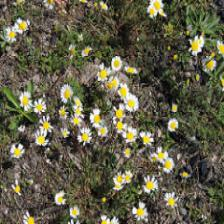

Actual    : daisy
Predicted : daisy
Confidence: 99.96%
----------------------------------------


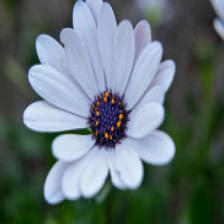

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


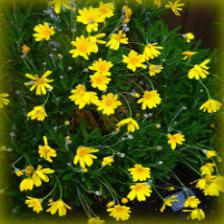

Actual    : daisy
Predicted : daisy
Confidence: 98.86%
----------------------------------------


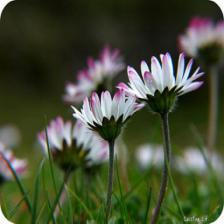

Actual    : daisy
Predicted : daisy
Confidence: 99.91%
----------------------------------------


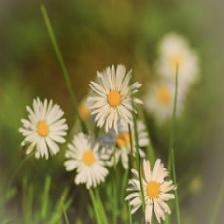

Actual    : daisy
Predicted : daisy
Confidence: 99.57%
----------------------------------------


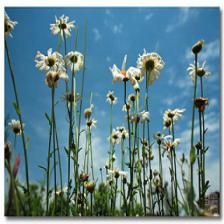

Actual    : daisy
Predicted : dandelion
Confidence: 65.71%
----------------------------------------


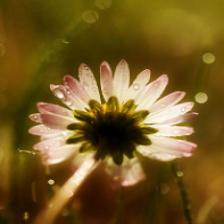

Actual    : daisy
Predicted : daisy
Confidence: 62.47%
----------------------------------------


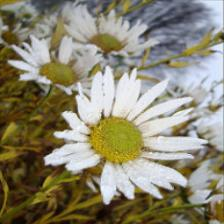

Actual    : daisy
Predicted : daisy
Confidence: 99.67%
----------------------------------------


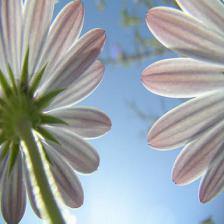

Actual    : daisy
Predicted : daisy
Confidence: 99.94%
----------------------------------------


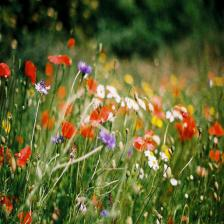

Actual    : daisy
Predicted : dandelion
Confidence: 96.74%
----------------------------------------


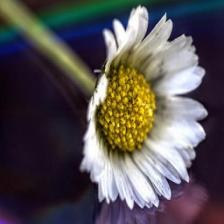

Actual    : daisy
Predicted : daisy
Confidence: 99.95%
----------------------------------------


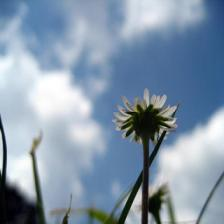

Actual    : daisy
Predicted : daisy
Confidence: 70.22%
----------------------------------------


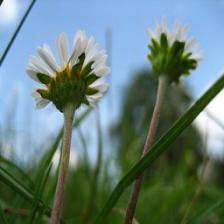

Actual    : daisy
Predicted : daisy
Confidence: 98.48%
----------------------------------------


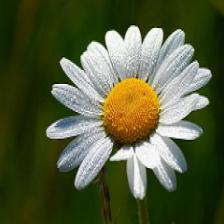

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


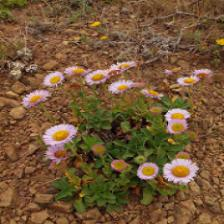

Actual    : daisy
Predicted : daisy
Confidence: 99.96%
----------------------------------------


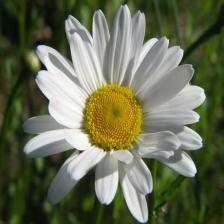

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


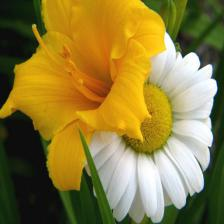

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


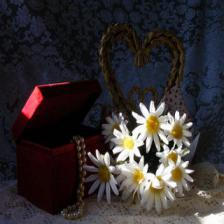

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


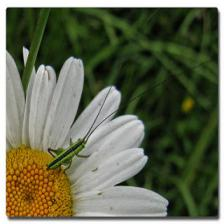

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


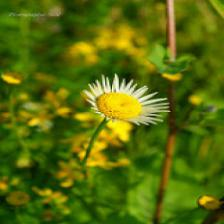

Actual    : daisy
Predicted : dandelion
Confidence: 75.35%
----------------------------------------


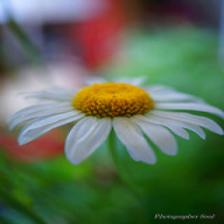

Actual    : daisy
Predicted : daisy
Confidence: 99.87%
----------------------------------------


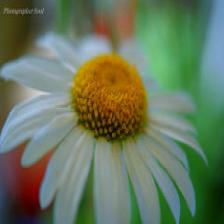

Actual    : daisy
Predicted : daisy
Confidence: 99.60%
----------------------------------------


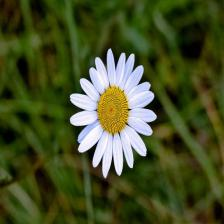

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


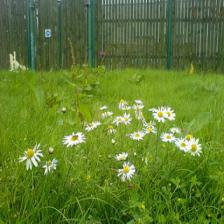

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


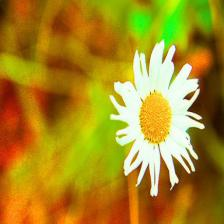

Actual    : daisy
Predicted : dandelion
Confidence: 54.87%
----------------------------------------


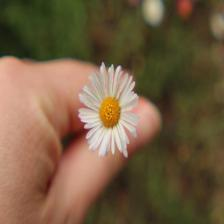

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


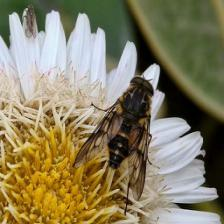

Actual    : daisy
Predicted : daisy
Confidence: 70.84%
----------------------------------------


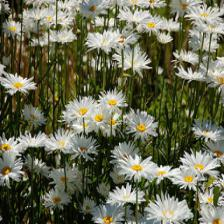

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


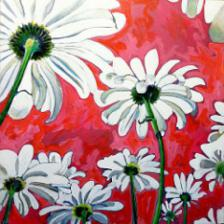

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


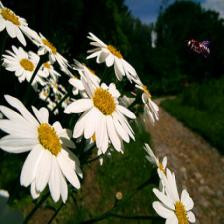

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


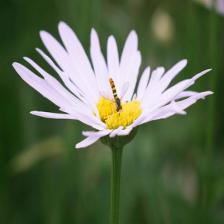

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


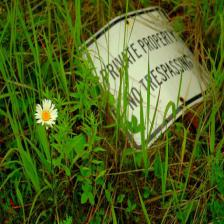

Actual    : daisy
Predicted : daisy
Confidence: 98.79%
----------------------------------------


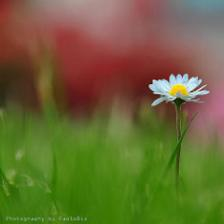

Actual    : daisy
Predicted : daisy
Confidence: 97.76%
----------------------------------------


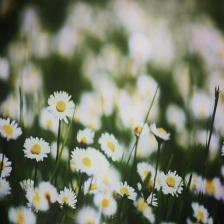

Actual    : daisy
Predicted : daisy
Confidence: 91.13%
----------------------------------------


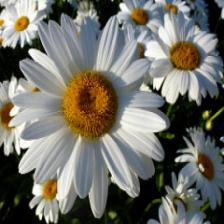

Actual    : daisy
Predicted : daisy
Confidence: 100.00%
----------------------------------------


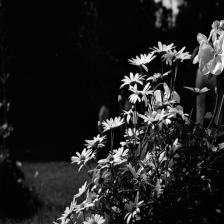

Actual    : daisy
Predicted : daisy
Confidence: 95.13%
----------------------------------------


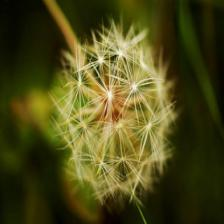

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


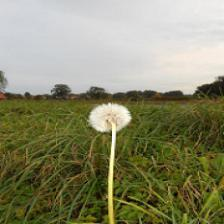

Actual    : dandelion
Predicted : dandelion
Confidence: 95.68%
----------------------------------------


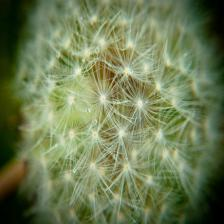

Actual    : dandelion
Predicted : dandelion
Confidence: 99.93%
----------------------------------------


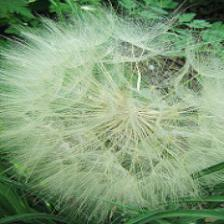

Actual    : dandelion
Predicted : dandelion
Confidence: 81.57%
----------------------------------------


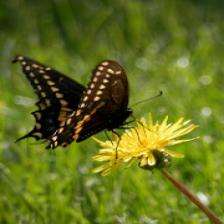

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


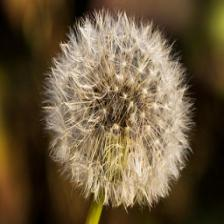

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


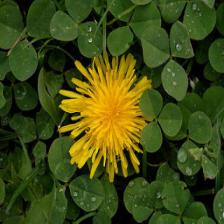

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


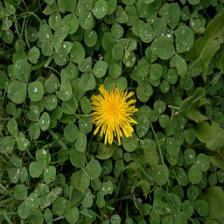

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


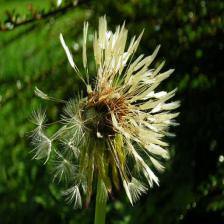

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


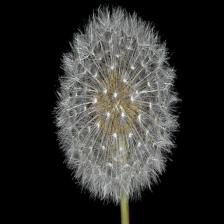

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


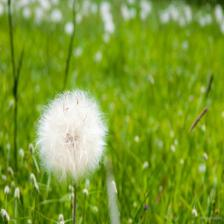

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


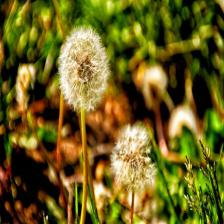

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


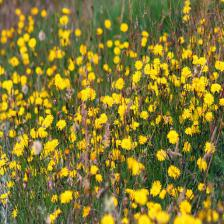

Actual    : dandelion
Predicted : dandelion
Confidence: 91.12%
----------------------------------------


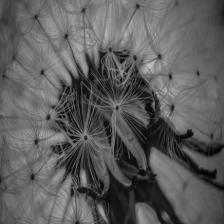

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


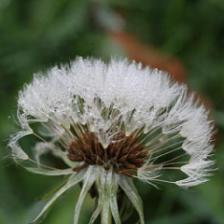

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


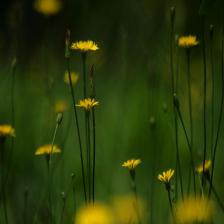

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


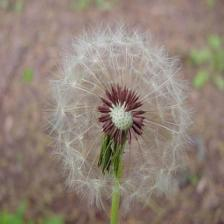

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


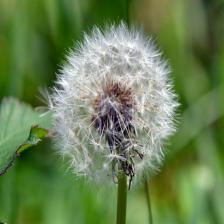

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


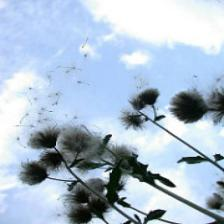

Actual    : dandelion
Predicted : dandelion
Confidence: 97.24%
----------------------------------------


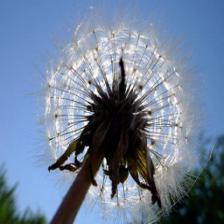

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


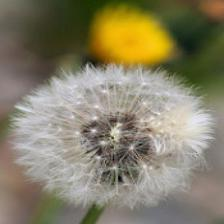

Actual    : dandelion
Predicted : dandelion
Confidence: 99.95%
----------------------------------------


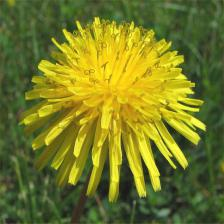

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


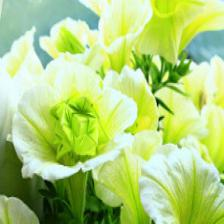

Actual    : dandelion
Predicted : dandelion
Confidence: 73.05%
----------------------------------------


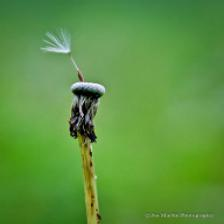

Actual    : dandelion
Predicted : dandelion
Confidence: 99.88%
----------------------------------------


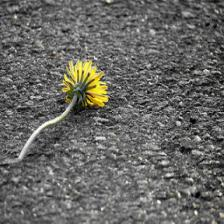

Actual    : dandelion
Predicted : dandelion
Confidence: 99.68%
----------------------------------------


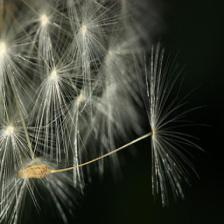

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


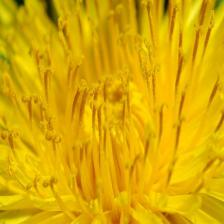

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


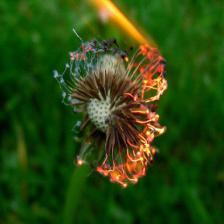

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


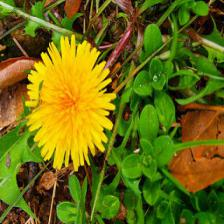

Actual    : dandelion
Predicted : dandelion
Confidence: 95.61%
----------------------------------------


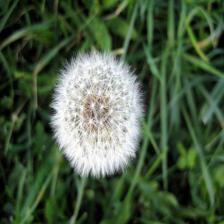

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


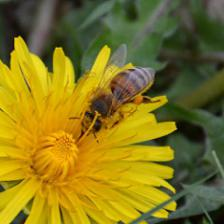

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


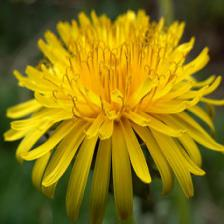

Actual    : dandelion
Predicted : dandelion
Confidence: 99.88%
----------------------------------------


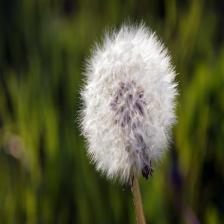

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


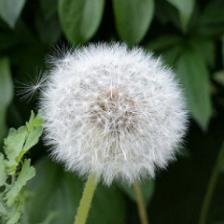

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


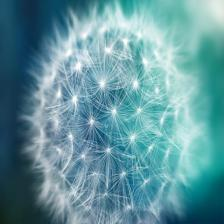

Actual    : dandelion
Predicted : dandelion
Confidence: 99.83%
----------------------------------------


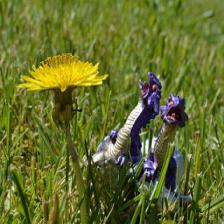

Actual    : dandelion
Predicted : dandelion
Confidence: 99.93%
----------------------------------------


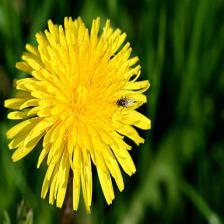

Actual    : dandelion
Predicted : dandelion
Confidence: 99.92%
----------------------------------------


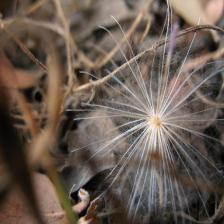

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


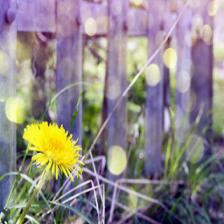

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


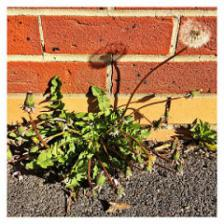

Actual    : dandelion
Predicted : dandelion
Confidence: 53.30%
----------------------------------------


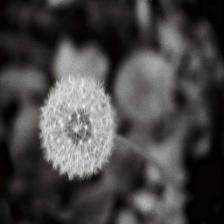

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


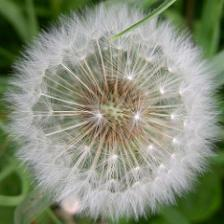

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


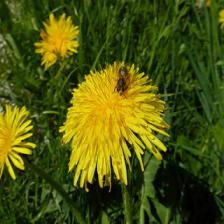

Actual    : dandelion
Predicted : dandelion
Confidence: 99.87%
----------------------------------------


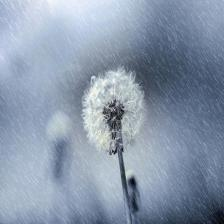

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


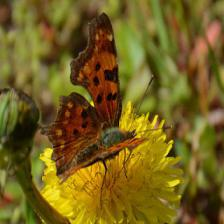

Actual    : dandelion
Predicted : daisy
Confidence: 57.90%
----------------------------------------


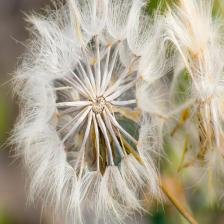

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


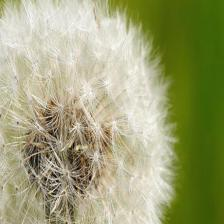

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


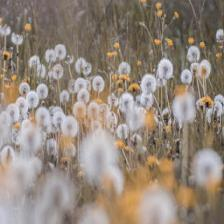

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


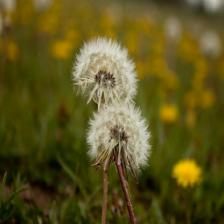

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


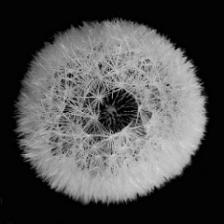

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


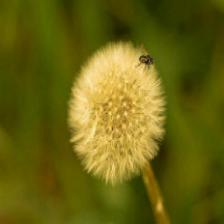

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


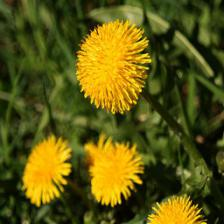

Actual    : dandelion
Predicted : dandelion
Confidence: 99.91%
----------------------------------------


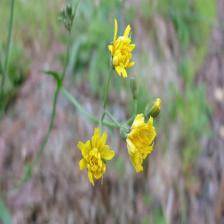

Actual    : dandelion
Predicted : dandelion
Confidence: 94.32%
----------------------------------------


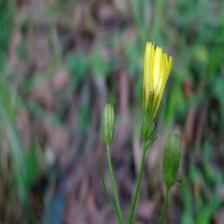

Actual    : dandelion
Predicted : dandelion
Confidence: 99.74%
----------------------------------------


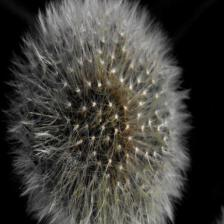

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


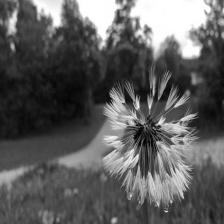

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


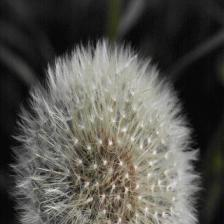

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


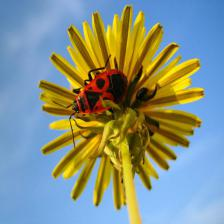

Actual    : dandelion
Predicted : dandelion
Confidence: 99.90%
----------------------------------------


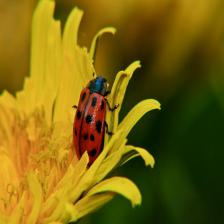

Actual    : dandelion
Predicted : daisy
Confidence: 99.55%
----------------------------------------


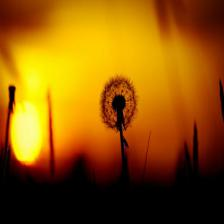

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


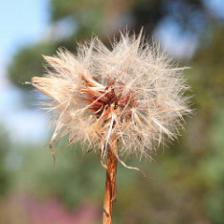

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


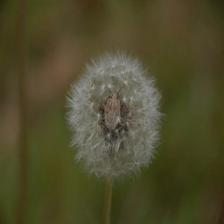

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


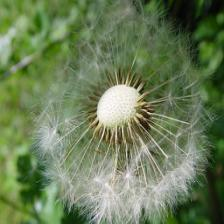

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


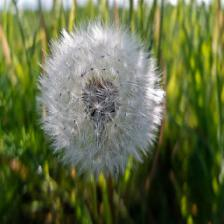

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


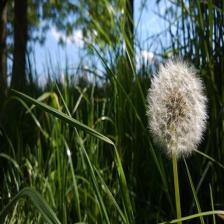

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


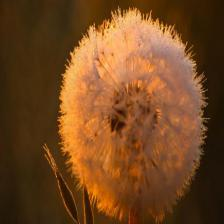

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


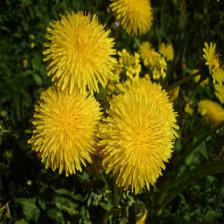

Actual    : dandelion
Predicted : dandelion
Confidence: 96.11%
----------------------------------------


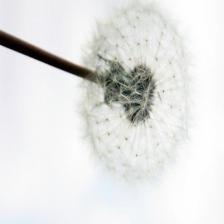

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


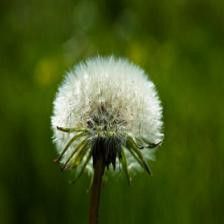

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


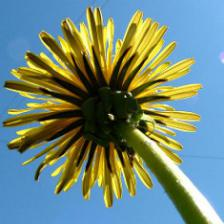

Actual    : dandelion
Predicted : dandelion
Confidence: 99.91%
----------------------------------------


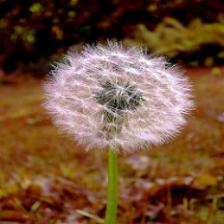

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


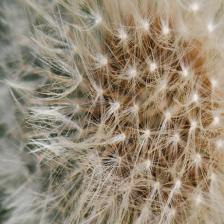

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


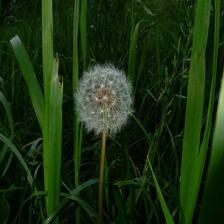

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


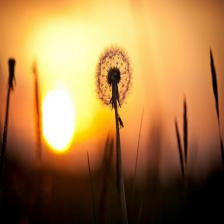

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


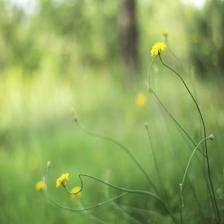

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


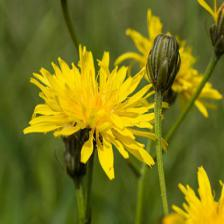

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


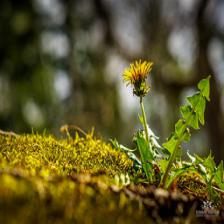

Actual    : dandelion
Predicted : dandelion
Confidence: 99.35%
----------------------------------------


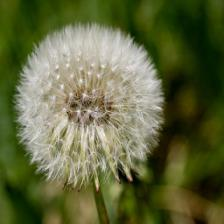

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


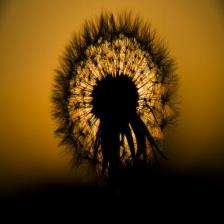

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


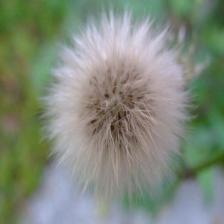

Actual    : dandelion
Predicted : dandelion
Confidence: 98.28%
----------------------------------------


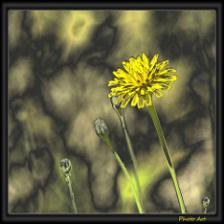

Actual    : dandelion
Predicted : dandelion
Confidence: 98.86%
----------------------------------------


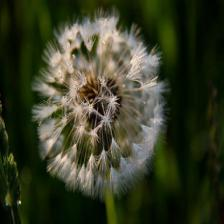

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


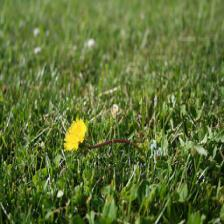

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


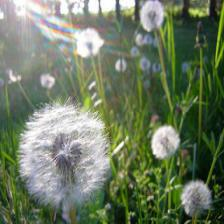

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


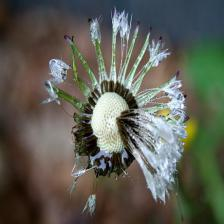

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


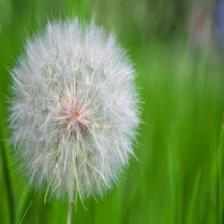

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


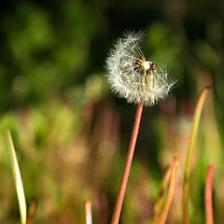

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


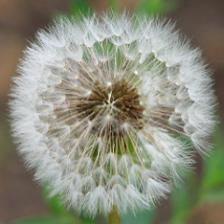

Actual    : dandelion
Predicted : dandelion
Confidence: 99.74%
----------------------------------------


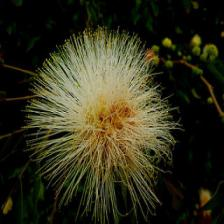

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


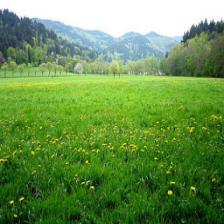

Actual    : dandelion
Predicted : dandelion
Confidence: 98.39%
----------------------------------------


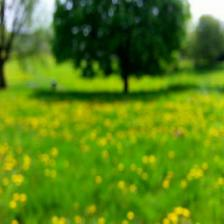

Actual    : dandelion
Predicted : dandelion
Confidence: 99.90%
----------------------------------------


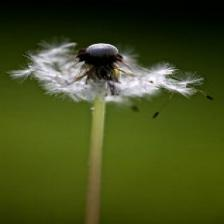

Actual    : dandelion
Predicted : dandelion
Confidence: 99.90%
----------------------------------------


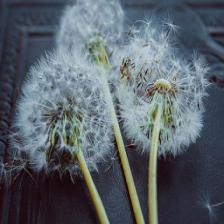

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


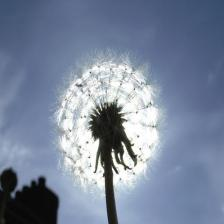

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


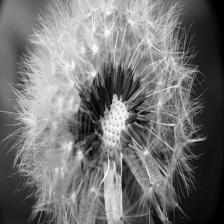

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


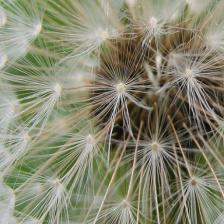

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


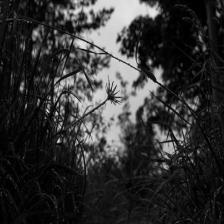

Actual    : dandelion
Predicted : daisy
Confidence: 75.38%
----------------------------------------


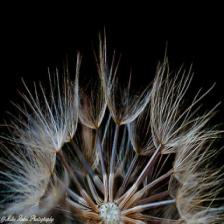

Actual    : dandelion
Predicted : dandelion
Confidence: 99.88%
----------------------------------------


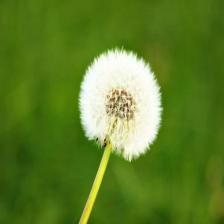

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


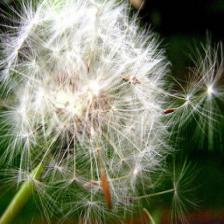

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


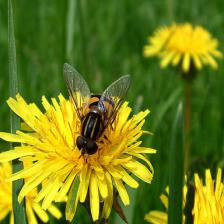

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


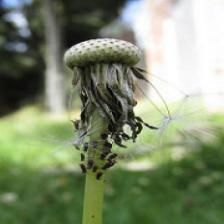

Actual    : dandelion
Predicted : dandelion
Confidence: 99.97%
----------------------------------------


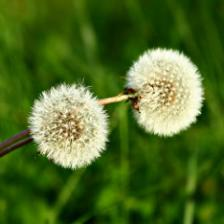

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


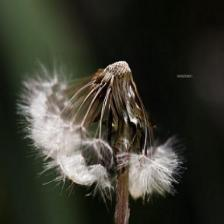

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


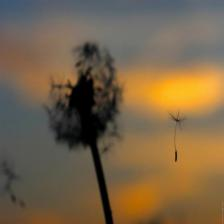

Actual    : dandelion
Predicted : dandelion
Confidence: 99.43%
----------------------------------------


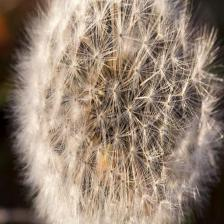

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


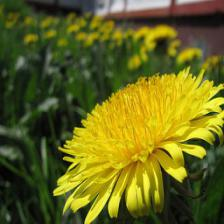

Actual    : dandelion
Predicted : dandelion
Confidence: 99.86%
----------------------------------------


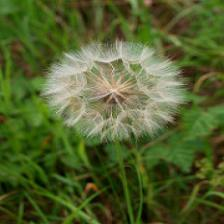

Actual    : dandelion
Predicted : dandelion
Confidence: 99.96%
----------------------------------------


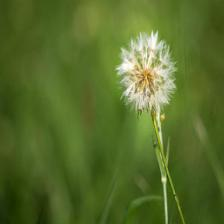

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


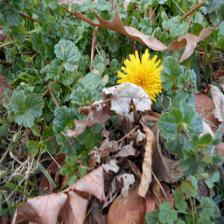

Actual    : dandelion
Predicted : dandelion
Confidence: 92.31%
----------------------------------------


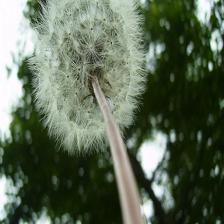

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


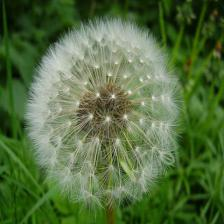

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


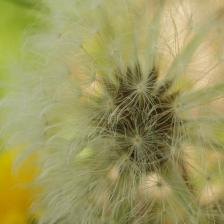

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


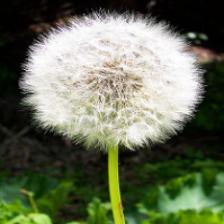

Actual    : dandelion
Predicted : dandelion
Confidence: 99.94%
----------------------------------------


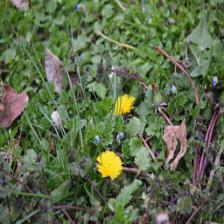

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


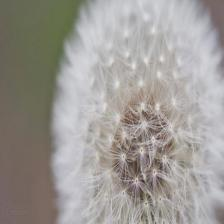

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


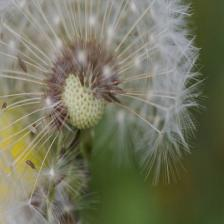

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


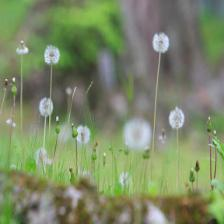

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


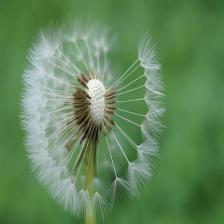

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


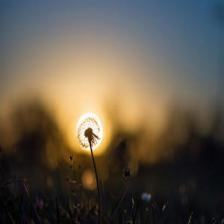

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


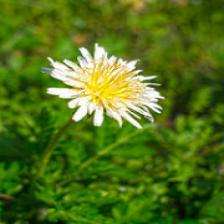

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


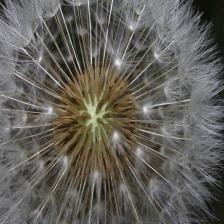

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


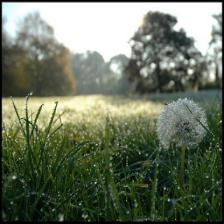

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


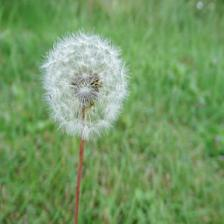

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


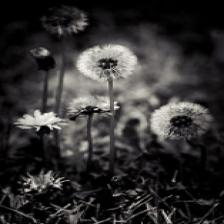

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


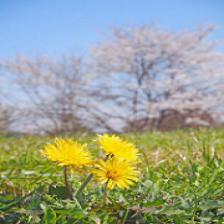

Actual    : dandelion
Predicted : dandelion
Confidence: 99.96%
----------------------------------------


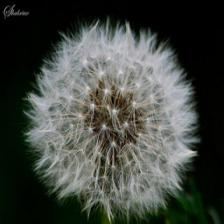

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


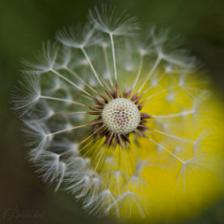

Actual    : dandelion
Predicted : dandelion
Confidence: 99.93%
----------------------------------------


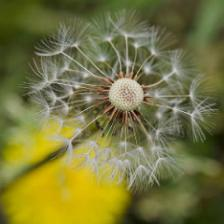

Actual    : dandelion
Predicted : dandelion
Confidence: 99.96%
----------------------------------------


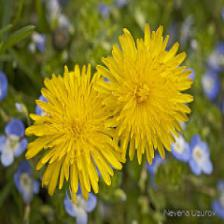

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


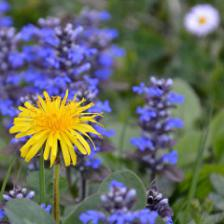

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


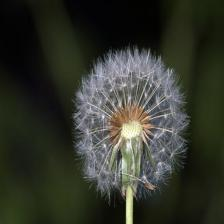

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


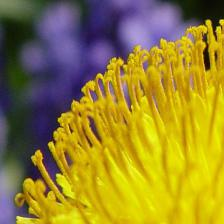

Actual    : dandelion
Predicted : dandelion
Confidence: 99.97%
----------------------------------------


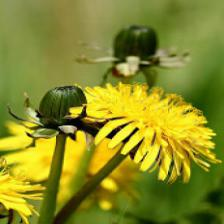

Actual    : dandelion
Predicted : dandelion
Confidence: 99.62%
----------------------------------------


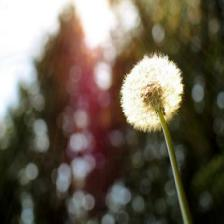

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


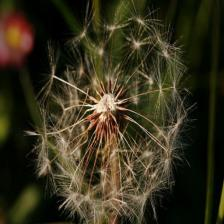

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


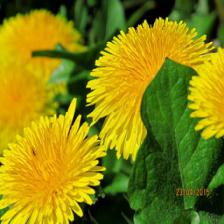

Actual    : dandelion
Predicted : dandelion
Confidence: 98.48%
----------------------------------------


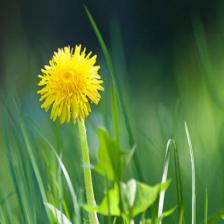

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


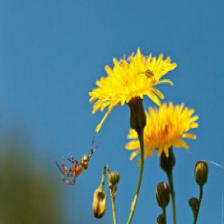

Actual    : dandelion
Predicted : dandelion
Confidence: 99.39%
----------------------------------------


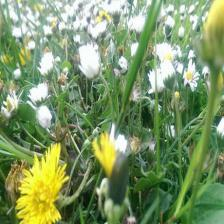

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


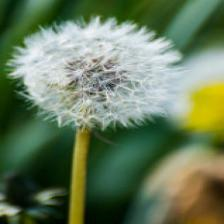

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


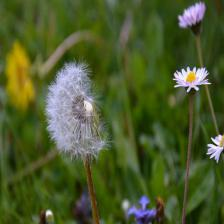

Actual    : dandelion
Predicted : dandelion
Confidence: 99.59%
----------------------------------------


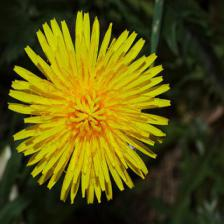

Actual    : dandelion
Predicted : dandelion
Confidence: 99.76%
----------------------------------------


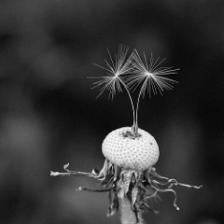

Actual    : dandelion
Predicted : dandelion
Confidence: 94.14%
----------------------------------------


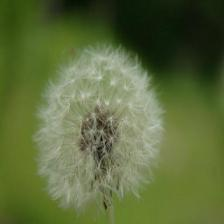

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


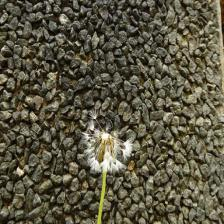

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


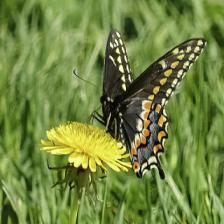

Actual    : dandelion
Predicted : dandelion
Confidence: 92.87%
----------------------------------------


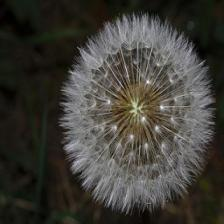

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


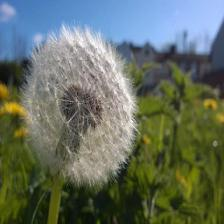

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


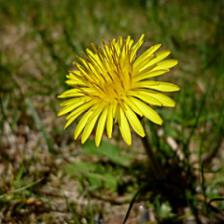

Actual    : dandelion
Predicted : dandelion
Confidence: 97.81%
----------------------------------------


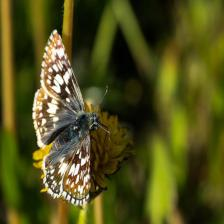

Actual    : dandelion
Predicted : dandelion
Confidence: 99.81%
----------------------------------------


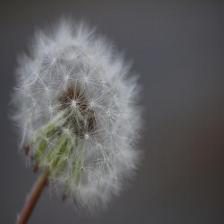

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


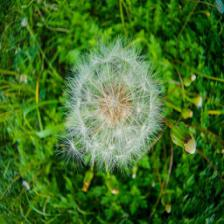

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


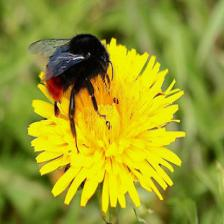

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


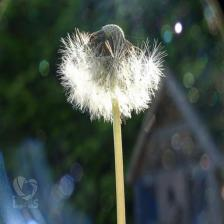

Actual    : dandelion
Predicted : dandelion
Confidence: 99.89%
----------------------------------------


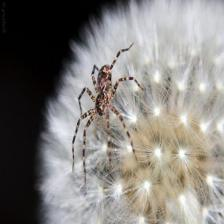

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


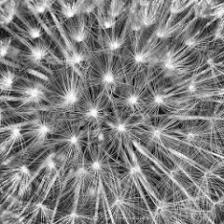

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


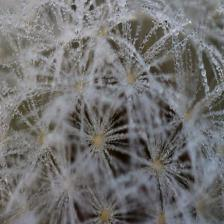

Actual    : dandelion
Predicted : dandelion
Confidence: 99.63%
----------------------------------------


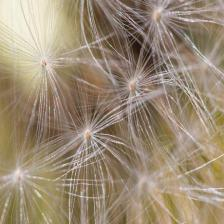

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


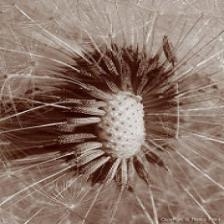

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


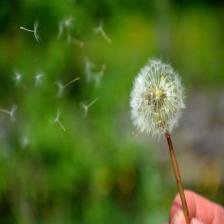

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


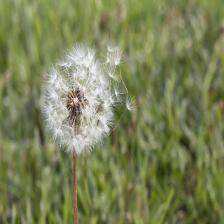

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


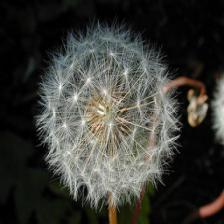

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


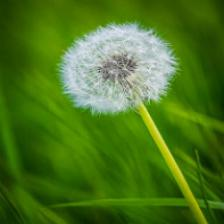

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


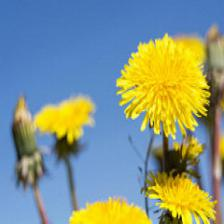

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


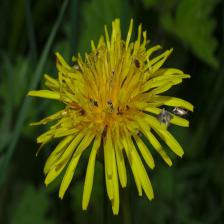

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


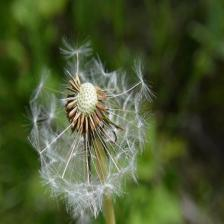

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


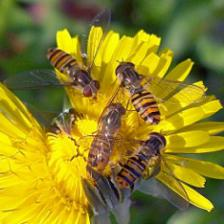

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


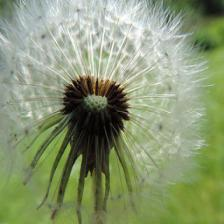

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


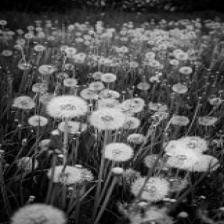

Actual    : dandelion
Predicted : dandelion
Confidence: 95.69%
----------------------------------------


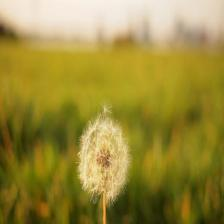

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


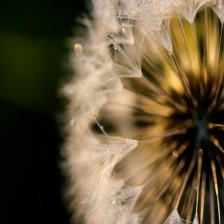

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


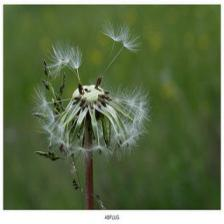

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


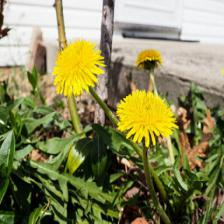

Actual    : dandelion
Predicted : dandelion
Confidence: 99.38%
----------------------------------------


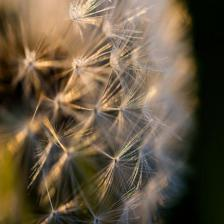

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


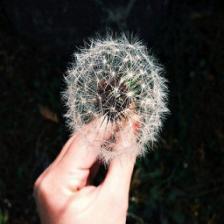

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


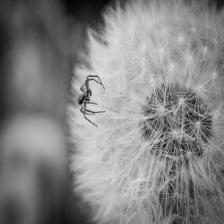

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


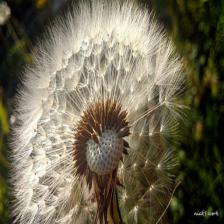

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


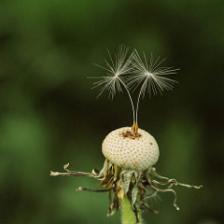

Actual    : dandelion
Predicted : dandelion
Confidence: 98.30%
----------------------------------------


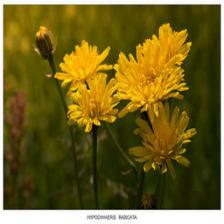

Actual    : dandelion
Predicted : dandelion
Confidence: 99.97%
----------------------------------------


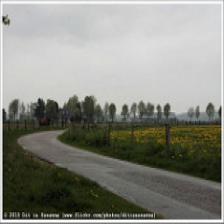

Actual    : dandelion
Predicted : dandelion
Confidence: 99.35%
----------------------------------------


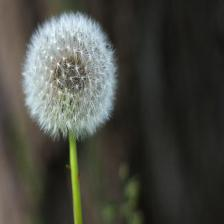

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


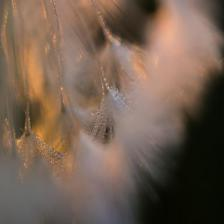

Actual    : dandelion
Predicted : dandelion
Confidence: 91.43%
----------------------------------------


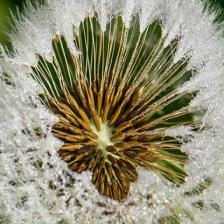

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


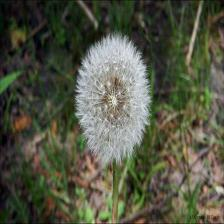

Actual    : dandelion
Predicted : dandelion
Confidence: 99.97%
----------------------------------------


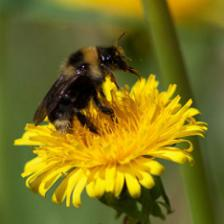

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


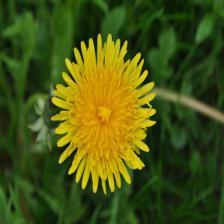

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


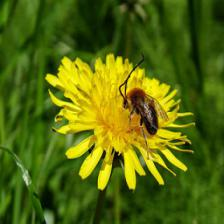

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


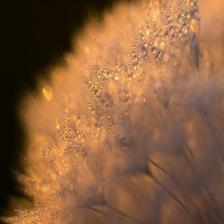

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


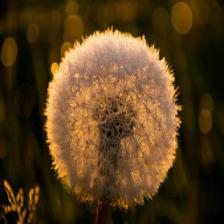

Actual    : dandelion
Predicted : dandelion
Confidence: 99.97%
----------------------------------------


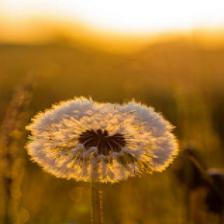

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


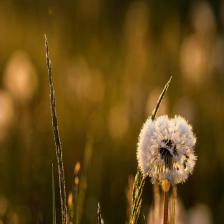

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


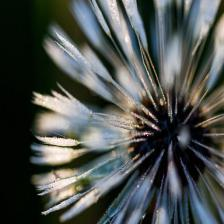

Actual    : dandelion
Predicted : dandelion
Confidence: 99.96%
----------------------------------------


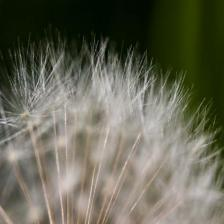

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


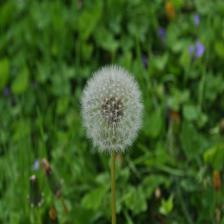

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


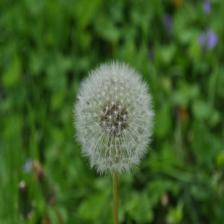

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


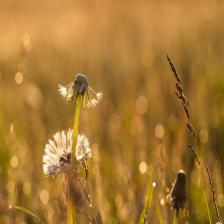

Actual    : dandelion
Predicted : dandelion
Confidence: 99.93%
----------------------------------------


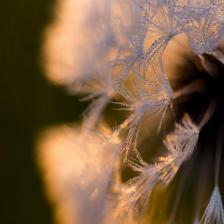

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


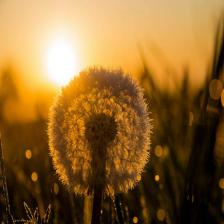

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


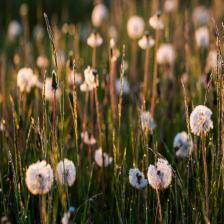

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


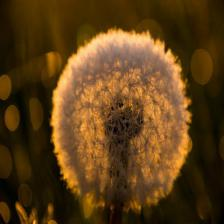

Actual    : dandelion
Predicted : dandelion
Confidence: 99.68%
----------------------------------------


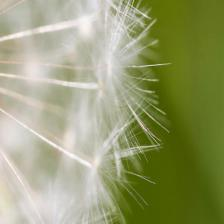

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


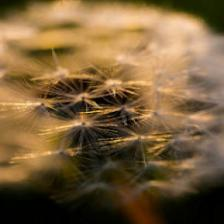

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


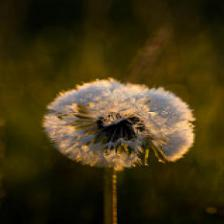

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


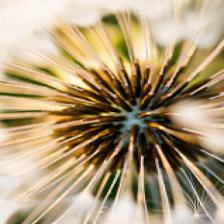

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


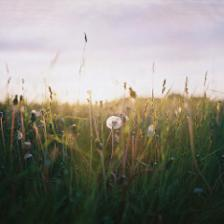

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


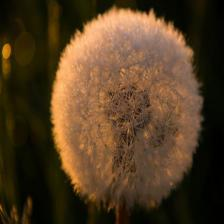

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


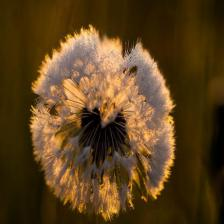

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


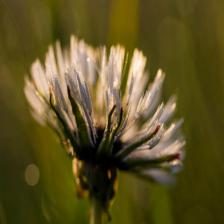

Actual    : dandelion
Predicted : dandelion
Confidence: 99.54%
----------------------------------------


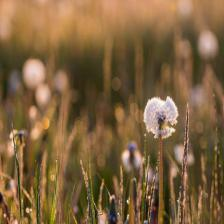

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


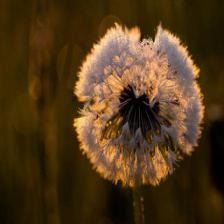

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


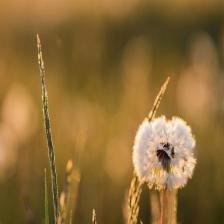

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


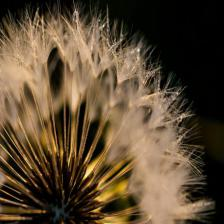

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


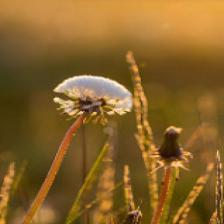

Actual    : dandelion
Predicted : dandelion
Confidence: 87.22%
----------------------------------------


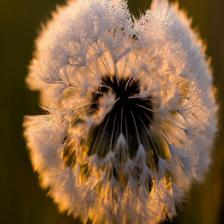

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


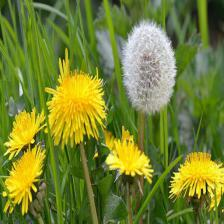

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


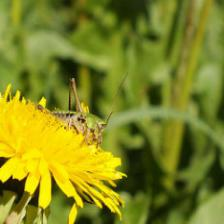

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


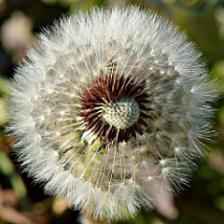

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


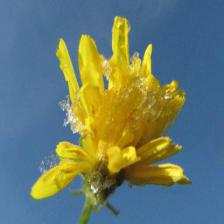

Actual    : dandelion
Predicted : dandelion
Confidence: 98.63%
----------------------------------------


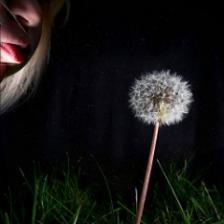

Actual    : dandelion
Predicted : dandelion
Confidence: 99.87%
----------------------------------------


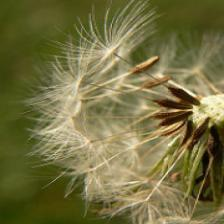

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


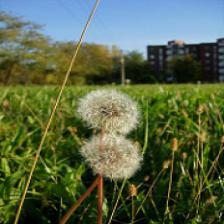

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


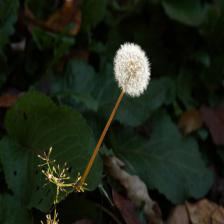

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


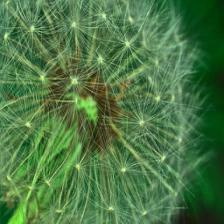

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


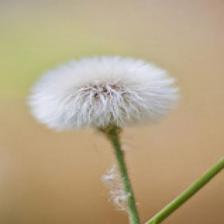

Actual    : dandelion
Predicted : dandelion
Confidence: 99.91%
----------------------------------------


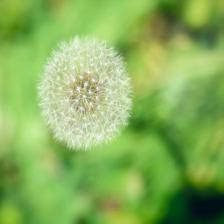

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


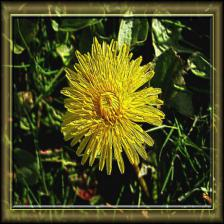

Actual    : dandelion
Predicted : dandelion
Confidence: 99.94%
----------------------------------------


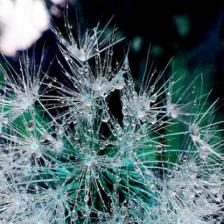

Actual    : dandelion
Predicted : dandelion
Confidence: 98.22%
----------------------------------------


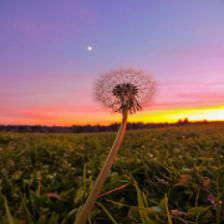

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


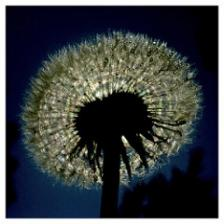

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


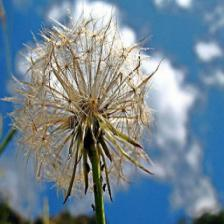

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


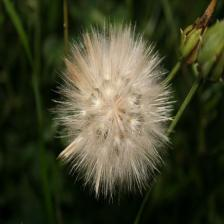

Actual    : dandelion
Predicted : dandelion
Confidence: 99.90%
----------------------------------------


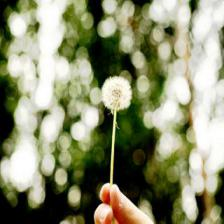

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


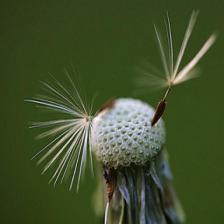

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


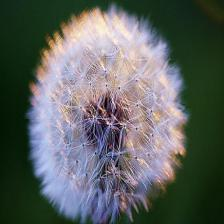

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


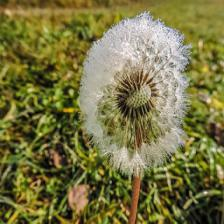

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


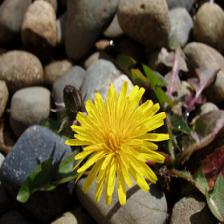

Actual    : dandelion
Predicted : dandelion
Confidence: 99.91%
----------------------------------------


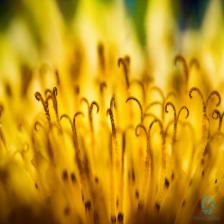

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


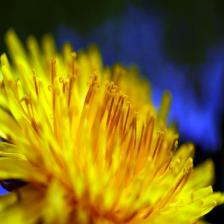

Actual    : dandelion
Predicted : dandelion
Confidence: 99.72%
----------------------------------------


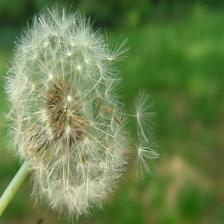

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


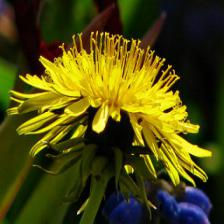

Actual    : dandelion
Predicted : dandelion
Confidence: 99.76%
----------------------------------------


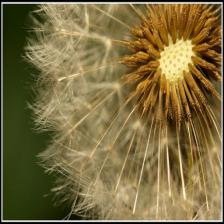

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


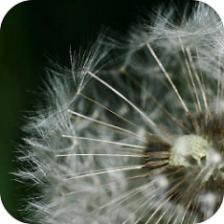

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


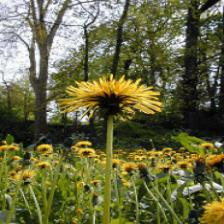

Actual    : dandelion
Predicted : dandelion
Confidence: 99.83%
----------------------------------------


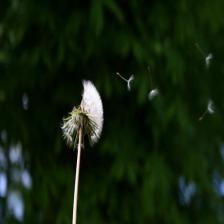

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


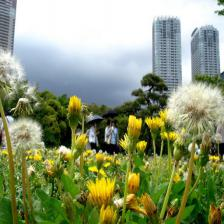

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


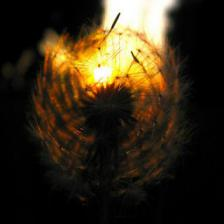

Actual    : dandelion
Predicted : dandelion
Confidence: 99.77%
----------------------------------------


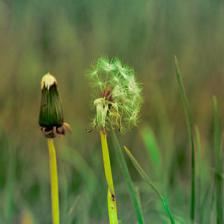

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


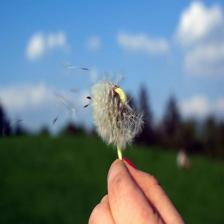

Actual    : dandelion
Predicted : dandelion
Confidence: 99.97%
----------------------------------------


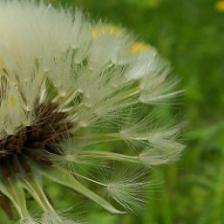

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


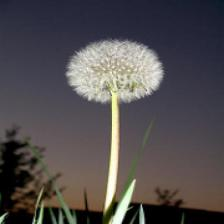

Actual    : dandelion
Predicted : dandelion
Confidence: 99.79%
----------------------------------------


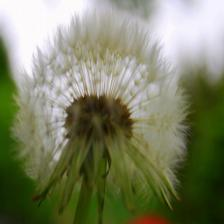

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


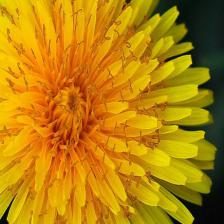

Actual    : dandelion
Predicted : dandelion
Confidence: 99.37%
----------------------------------------


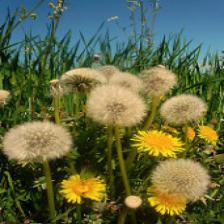

Actual    : dandelion
Predicted : dandelion
Confidence: 99.92%
----------------------------------------


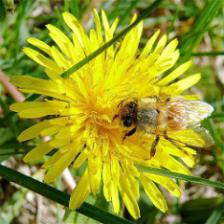

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


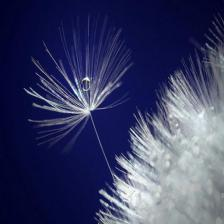

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


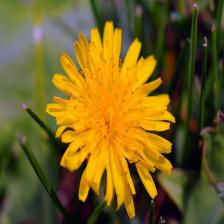

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


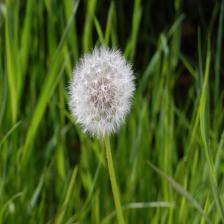

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


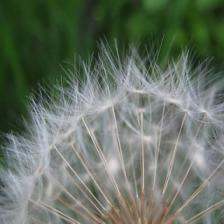

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


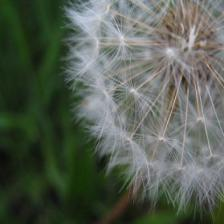

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


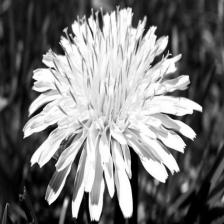

Actual    : dandelion
Predicted : dandelion
Confidence: 99.53%
----------------------------------------


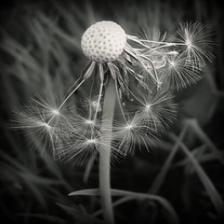

Actual    : dandelion
Predicted : dandelion
Confidence: 99.71%
----------------------------------------


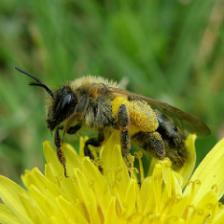

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


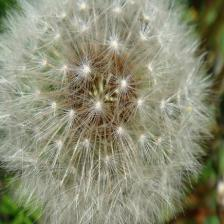

Actual    : dandelion
Predicted : dandelion
Confidence: 99.94%
----------------------------------------


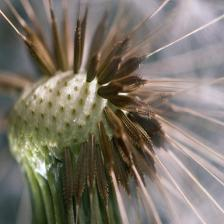

Actual    : dandelion
Predicted : dandelion
Confidence: 99.83%
----------------------------------------


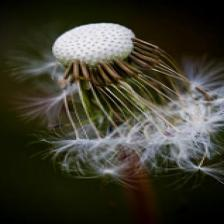

Actual    : dandelion
Predicted : dandelion
Confidence: 99.97%
----------------------------------------


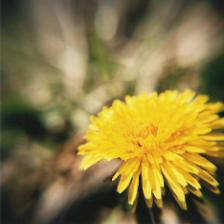

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


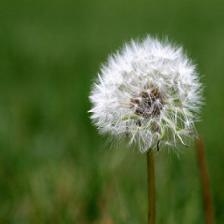

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


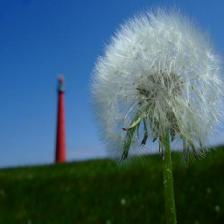

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


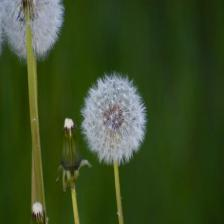

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


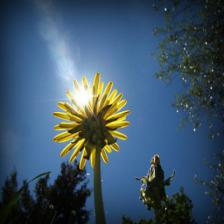

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


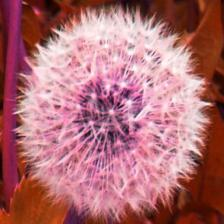

Actual    : dandelion
Predicted : dandelion
Confidence: 99.35%
----------------------------------------


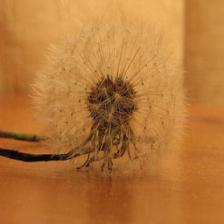

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


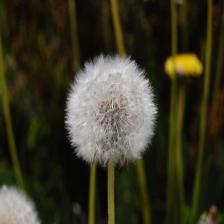

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


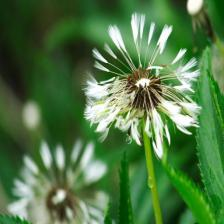

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


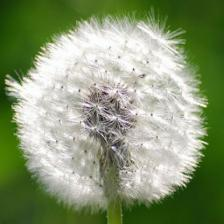

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


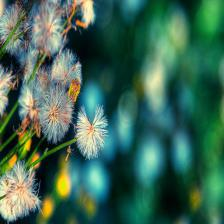

Actual    : dandelion
Predicted : dandelion
Confidence: 99.30%
----------------------------------------


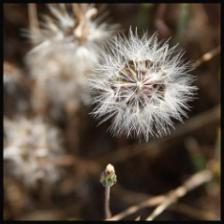

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


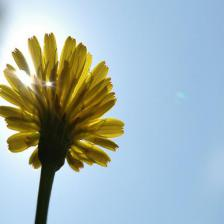

Actual    : dandelion
Predicted : dandelion
Confidence: 98.34%
----------------------------------------


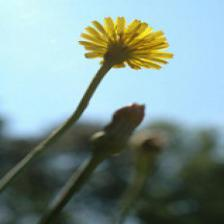

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


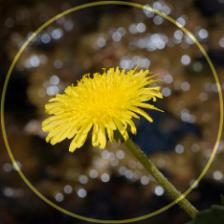

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


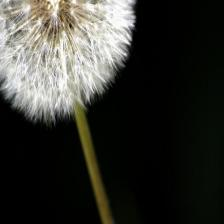

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


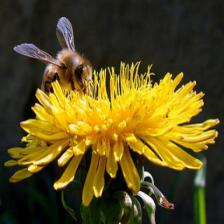

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


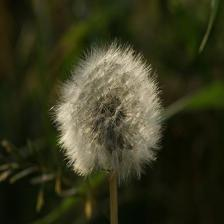

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


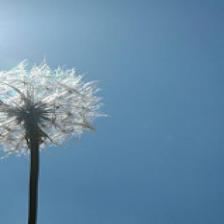

Actual    : dandelion
Predicted : dandelion
Confidence: 99.11%
----------------------------------------


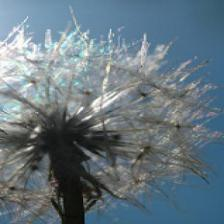

Actual    : dandelion
Predicted : dandelion
Confidence: 99.63%
----------------------------------------


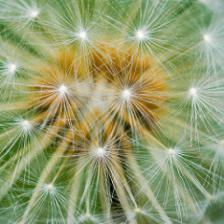

Actual    : dandelion
Predicted : dandelion
Confidence: 99.95%
----------------------------------------


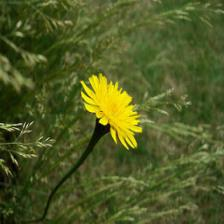

Actual    : dandelion
Predicted : dandelion
Confidence: 96.10%
----------------------------------------


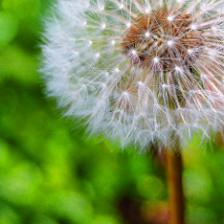

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


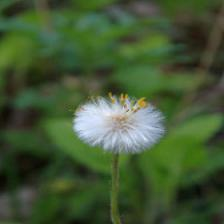

Actual    : dandelion
Predicted : dandelion
Confidence: 99.65%
----------------------------------------


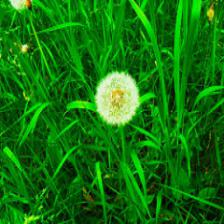

Actual    : dandelion
Predicted : dandelion
Confidence: 99.92%
----------------------------------------


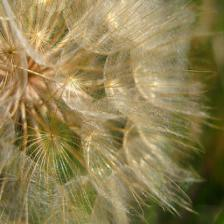

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


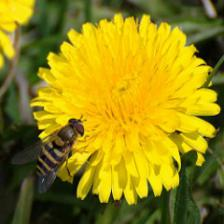

Actual    : dandelion
Predicted : dandelion
Confidence: 99.57%
----------------------------------------


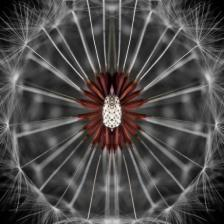

Actual    : dandelion
Predicted : dandelion
Confidence: 99.93%
----------------------------------------


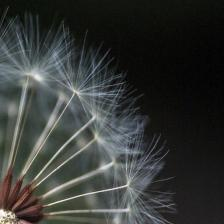

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


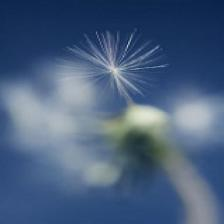

Actual    : dandelion
Predicted : dandelion
Confidence: 99.97%
----------------------------------------


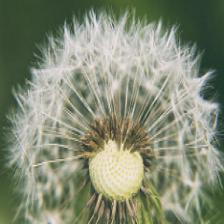

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


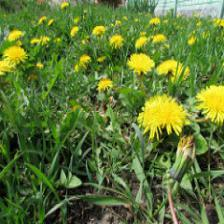

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


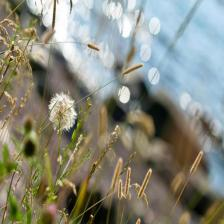

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


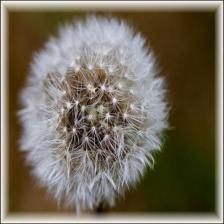

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


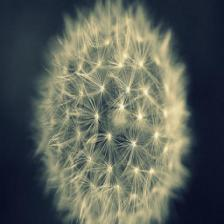

Actual    : dandelion
Predicted : dandelion
Confidence: 99.95%
----------------------------------------


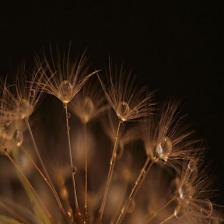

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


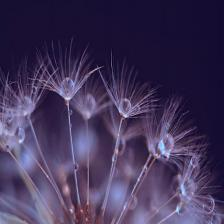

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


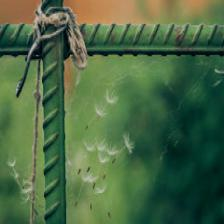

Actual    : dandelion
Predicted : dandelion
Confidence: 99.97%
----------------------------------------


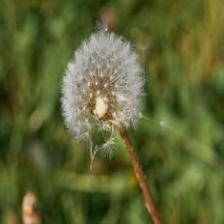

Actual    : dandelion
Predicted : dandelion
Confidence: 99.96%
----------------------------------------


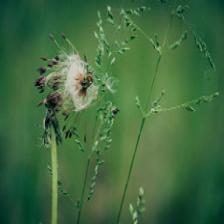

Actual    : dandelion
Predicted : dandelion
Confidence: 99.97%
----------------------------------------


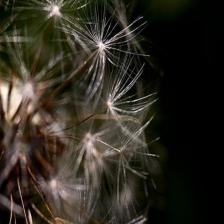

Actual    : dandelion
Predicted : dandelion
Confidence: 99.95%
----------------------------------------


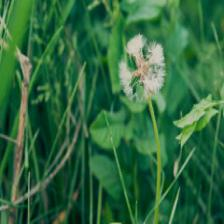

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


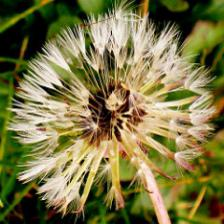

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


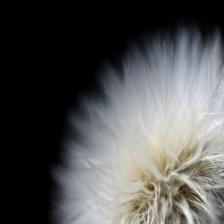

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


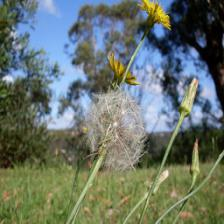

Actual    : dandelion
Predicted : dandelion
Confidence: 99.40%
----------------------------------------


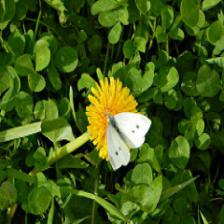

Actual    : dandelion
Predicted : dandelion
Confidence: 97.37%
----------------------------------------


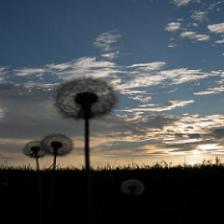

Actual    : dandelion
Predicted : dandelion
Confidence: 99.95%
----------------------------------------


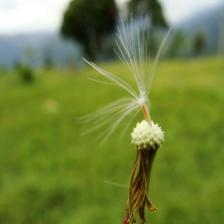

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


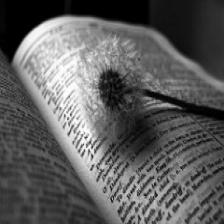

Actual    : dandelion
Predicted : dandelion
Confidence: 99.13%
----------------------------------------


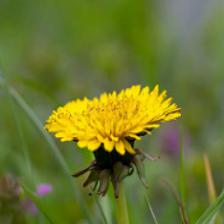

Actual    : dandelion
Predicted : dandelion
Confidence: 99.79%
----------------------------------------


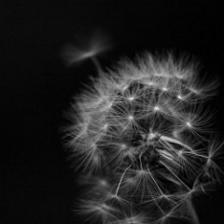

Actual    : dandelion
Predicted : dandelion
Confidence: 99.72%
----------------------------------------


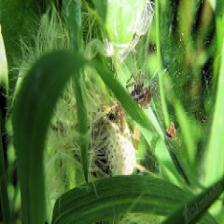

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


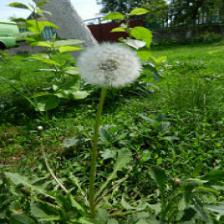

Actual    : dandelion
Predicted : dandelion
Confidence: 97.76%
----------------------------------------


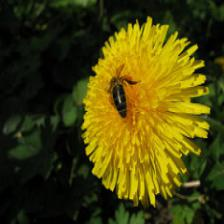

Actual    : dandelion
Predicted : dandelion
Confidence: 93.83%
----------------------------------------


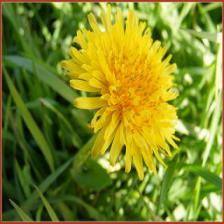

Actual    : dandelion
Predicted : dandelion
Confidence: 99.95%
----------------------------------------


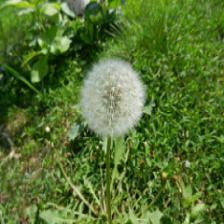

Actual    : dandelion
Predicted : dandelion
Confidence: 99.83%
----------------------------------------


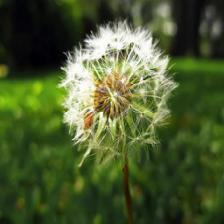

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


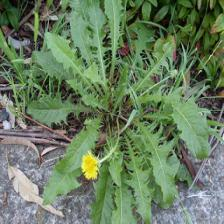

Actual    : dandelion
Predicted : dandelion
Confidence: 99.65%
----------------------------------------


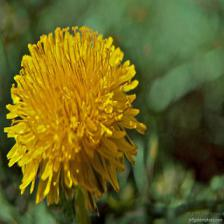

Actual    : dandelion
Predicted : dandelion
Confidence: 99.96%
----------------------------------------


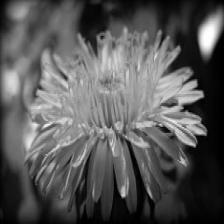

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


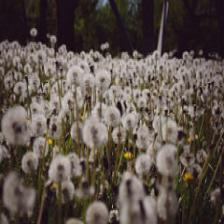

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


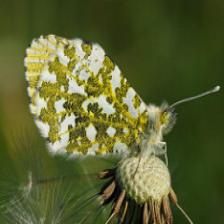

Actual    : dandelion
Predicted : dandelion
Confidence: 99.88%
----------------------------------------


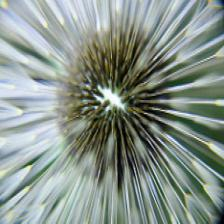

Actual    : dandelion
Predicted : dandelion
Confidence: 99.94%
----------------------------------------


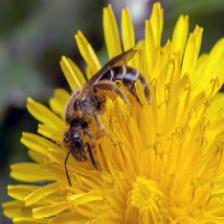

Actual    : dandelion
Predicted : dandelion
Confidence: 99.97%
----------------------------------------


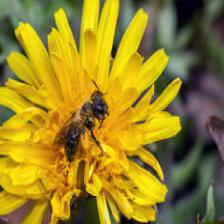

Actual    : dandelion
Predicted : dandelion
Confidence: 99.87%
----------------------------------------


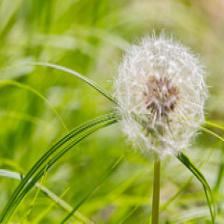

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


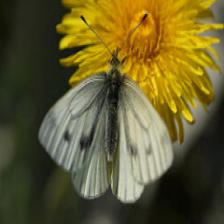

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


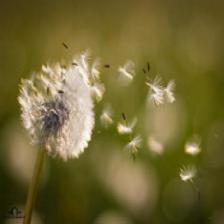

Actual    : dandelion
Predicted : dandelion
Confidence: 99.97%
----------------------------------------


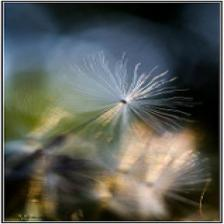

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


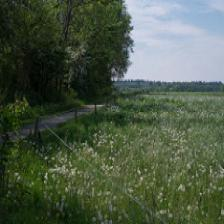

Actual    : dandelion
Predicted : dandelion
Confidence: 93.96%
----------------------------------------


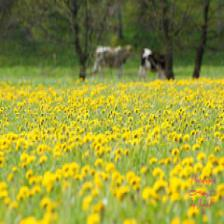

Actual    : dandelion
Predicted : dandelion
Confidence: 99.92%
----------------------------------------


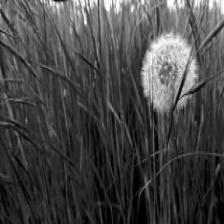

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


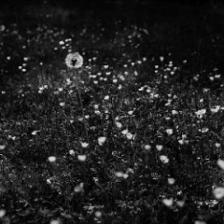

Actual    : dandelion
Predicted : dandelion
Confidence: 99.77%
----------------------------------------


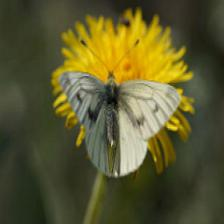

Actual    : dandelion
Predicted : dandelion
Confidence: 99.95%
----------------------------------------


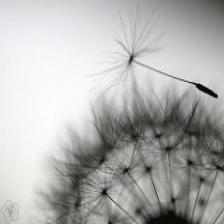

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


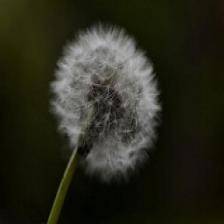

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


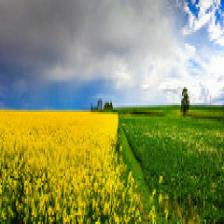

Actual    : dandelion
Predicted : dandelion
Confidence: 99.90%
----------------------------------------


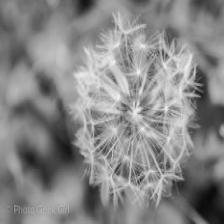

Actual    : dandelion
Predicted : dandelion
Confidence: 99.96%
----------------------------------------


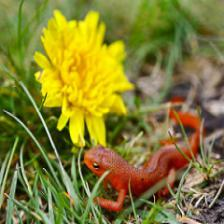

Actual    : dandelion
Predicted : dandelion
Confidence: 99.67%
----------------------------------------


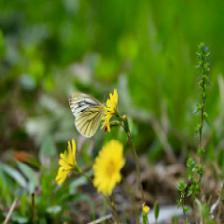

Actual    : dandelion
Predicted : dandelion
Confidence: 99.61%
----------------------------------------


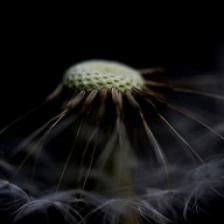

Actual    : dandelion
Predicted : dandelion
Confidence: 99.96%
----------------------------------------


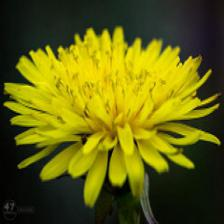

Actual    : dandelion
Predicted : dandelion
Confidence: 99.67%
----------------------------------------


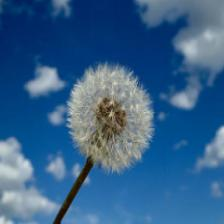

Actual    : dandelion
Predicted : dandelion
Confidence: 99.97%
----------------------------------------


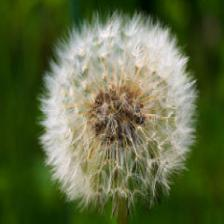

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


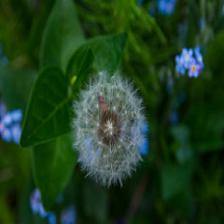

Actual    : dandelion
Predicted : dandelion
Confidence: 99.85%
----------------------------------------


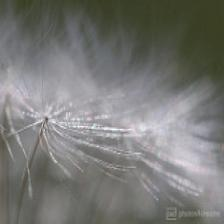

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


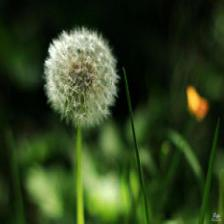

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


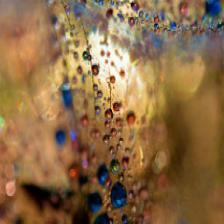

Actual    : dandelion
Predicted : dandelion
Confidence: 98.95%
----------------------------------------


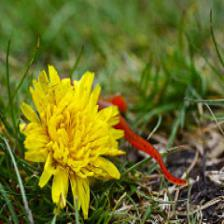

Actual    : dandelion
Predicted : dandelion
Confidence: 98.55%
----------------------------------------


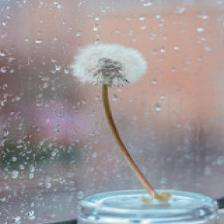

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


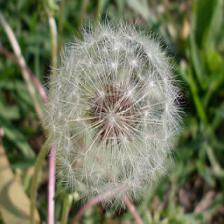

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


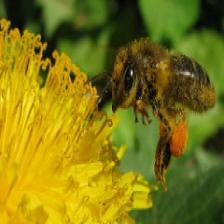

Actual    : dandelion
Predicted : dandelion
Confidence: 97.67%
----------------------------------------


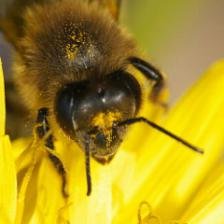

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


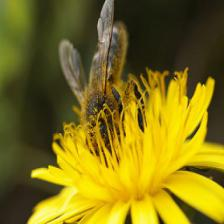

Actual    : dandelion
Predicted : dandelion
Confidence: 99.83%
----------------------------------------


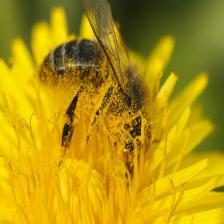

Actual    : dandelion
Predicted : dandelion
Confidence: 99.82%
----------------------------------------


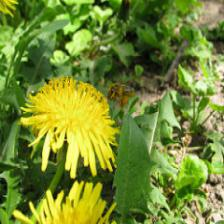

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


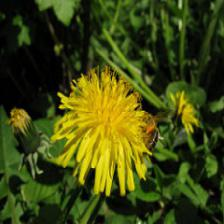

Actual    : dandelion
Predicted : dandelion
Confidence: 99.97%
----------------------------------------


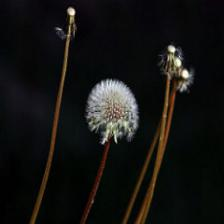

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


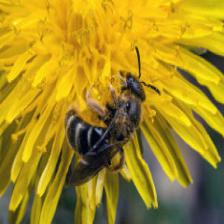

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


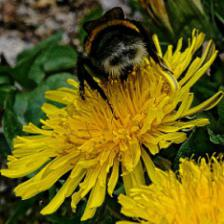

Actual    : dandelion
Predicted : dandelion
Confidence: 99.89%
----------------------------------------


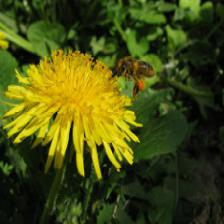

Actual    : dandelion
Predicted : dandelion
Confidence: 99.53%
----------------------------------------


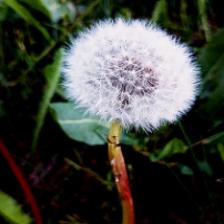

Actual    : dandelion
Predicted : dandelion
Confidence: 99.94%
----------------------------------------


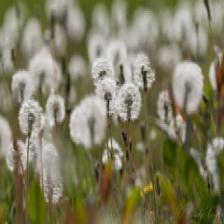

Actual    : dandelion
Predicted : dandelion
Confidence: 99.93%
----------------------------------------


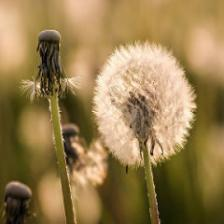

Actual    : dandelion
Predicted : dandelion
Confidence: 99.94%
----------------------------------------


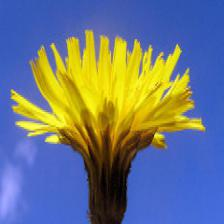

Actual    : dandelion
Predicted : dandelion
Confidence: 97.20%
----------------------------------------


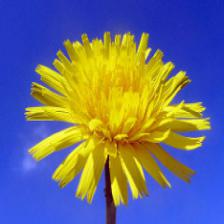

Actual    : dandelion
Predicted : dandelion
Confidence: 99.44%
----------------------------------------


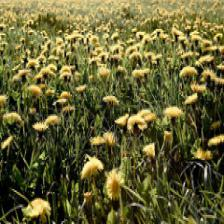

Actual    : dandelion
Predicted : dandelion
Confidence: 99.91%
----------------------------------------


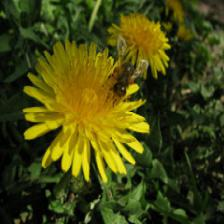

Actual    : dandelion
Predicted : dandelion
Confidence: 99.74%
----------------------------------------


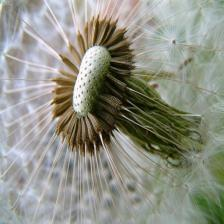

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


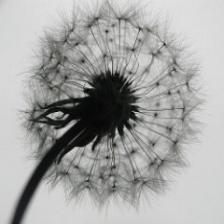

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


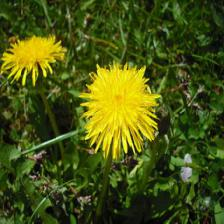

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


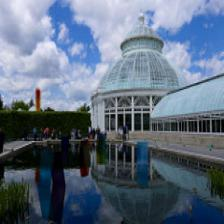

Actual    : dandelion
Predicted : dandelion
Confidence: 99.68%
----------------------------------------


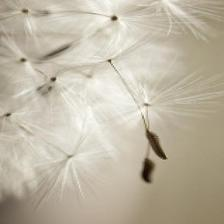

Actual    : dandelion
Predicted : dandelion
Confidence: 97.38%
----------------------------------------


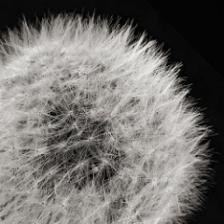

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


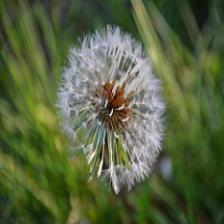

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


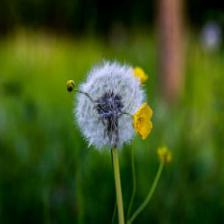

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


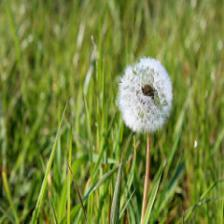

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


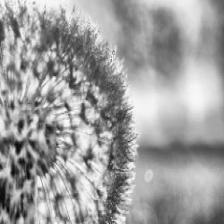

Actual    : dandelion
Predicted : dandelion
Confidence: 99.92%
----------------------------------------


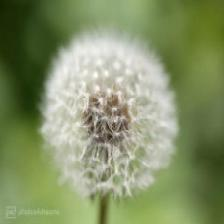

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


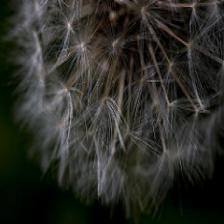

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


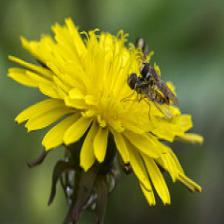

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


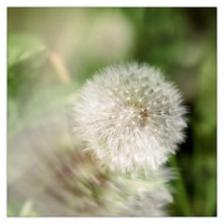

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


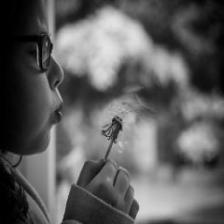

Actual    : dandelion
Predicted : dandelion
Confidence: 99.54%
----------------------------------------


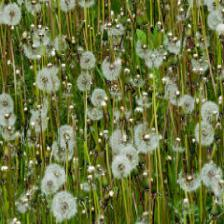

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


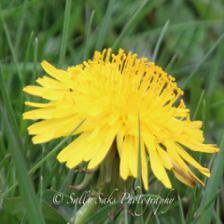

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


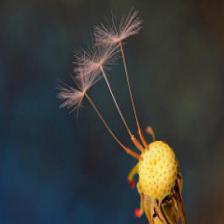

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


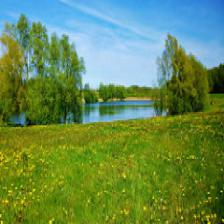

Actual    : dandelion
Predicted : dandelion
Confidence: 97.49%
----------------------------------------


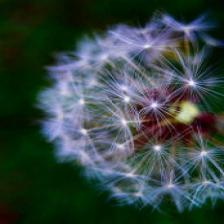

Actual    : dandelion
Predicted : dandelion
Confidence: 98.16%
----------------------------------------


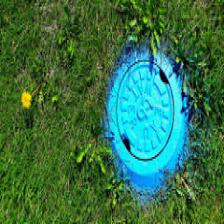

Actual    : dandelion
Predicted : dandelion
Confidence: 88.65%
----------------------------------------


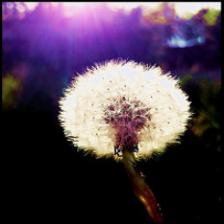

Actual    : dandelion
Predicted : dandelion
Confidence: 99.41%
----------------------------------------


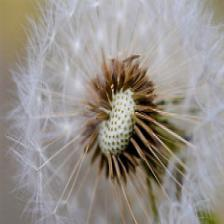

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


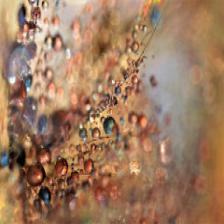

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


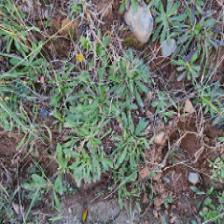

Actual    : dandelion
Predicted : dandelion
Confidence: 62.52%
----------------------------------------


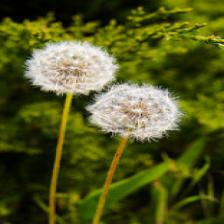

Actual    : dandelion
Predicted : dandelion
Confidence: 99.79%
----------------------------------------


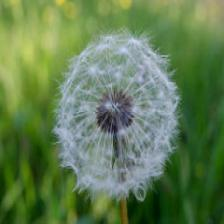

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


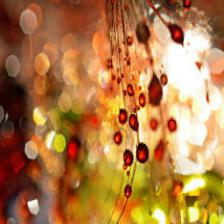

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


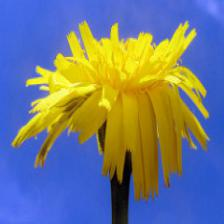

Actual    : dandelion
Predicted : dandelion
Confidence: 99.89%
----------------------------------------


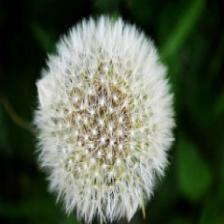

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


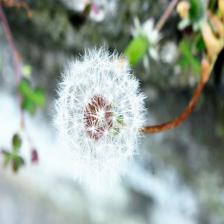

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


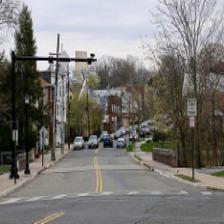

Actual    : dandelion
Predicted : dandelion
Confidence: 98.70%
----------------------------------------


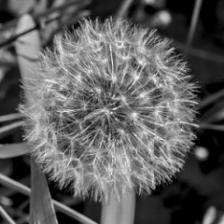

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


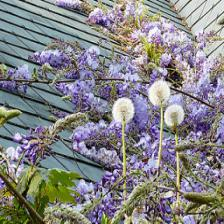

Actual    : dandelion
Predicted : dandelion
Confidence: 80.46%
----------------------------------------


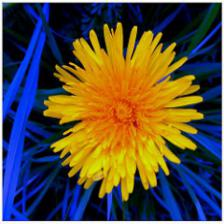

Actual    : dandelion
Predicted : dandelion
Confidence: 97.27%
----------------------------------------


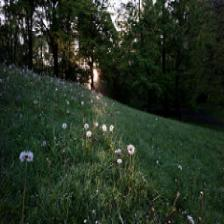

Actual    : dandelion
Predicted : dandelion
Confidence: 98.14%
----------------------------------------


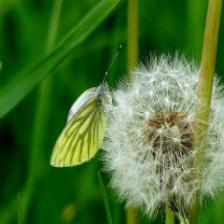

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


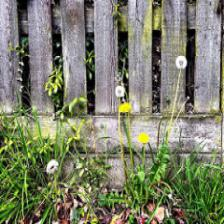

Actual    : dandelion
Predicted : dandelion
Confidence: 77.27%
----------------------------------------


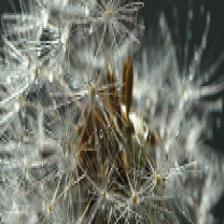

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


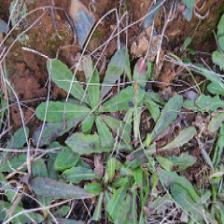

Actual    : dandelion
Predicted : dandelion
Confidence: 97.59%
----------------------------------------


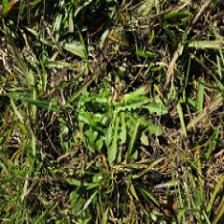

Actual    : dandelion
Predicted : dandelion
Confidence: 63.60%
----------------------------------------


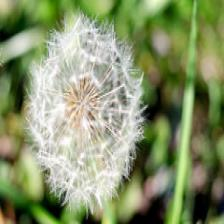

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


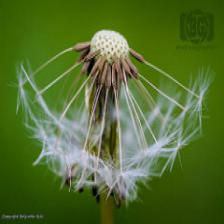

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


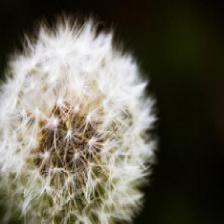

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


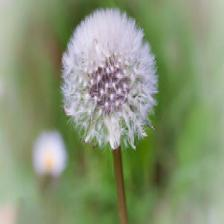

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


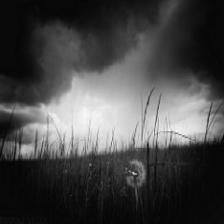

Actual    : dandelion
Predicted : dandelion
Confidence: 99.60%
----------------------------------------


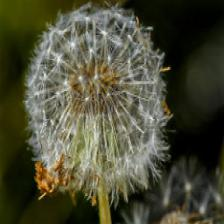

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


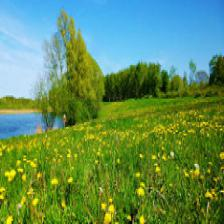

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


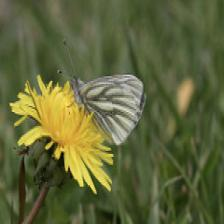

Actual    : dandelion
Predicted : dandelion
Confidence: 99.97%
----------------------------------------


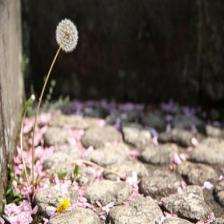

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


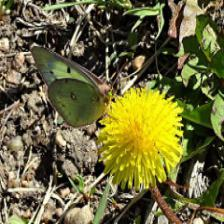

Actual    : dandelion
Predicted : dandelion
Confidence: 98.51%
----------------------------------------


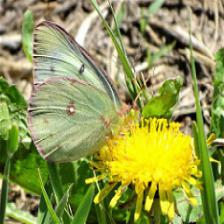

Actual    : dandelion
Predicted : dandelion
Confidence: 99.94%
----------------------------------------


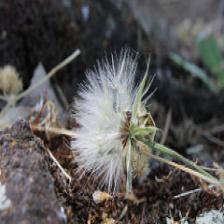

Actual    : dandelion
Predicted : dandelion
Confidence: 99.89%
----------------------------------------


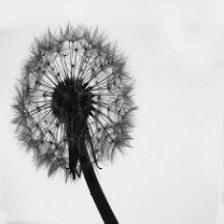

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


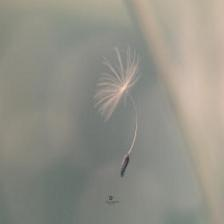

Actual    : dandelion
Predicted : dandelion
Confidence: 99.91%
----------------------------------------


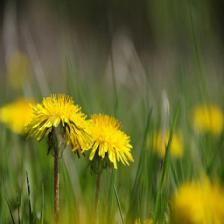

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


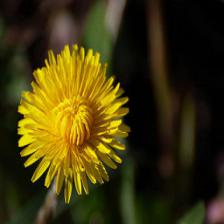

Actual    : dandelion
Predicted : dandelion
Confidence: 99.59%
----------------------------------------


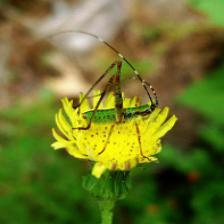

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


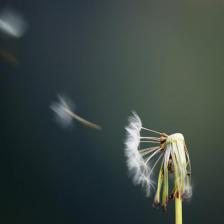

Actual    : dandelion
Predicted : dandelion
Confidence: 99.97%
----------------------------------------


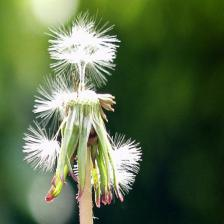

Actual    : dandelion
Predicted : dandelion
Confidence: 99.84%
----------------------------------------


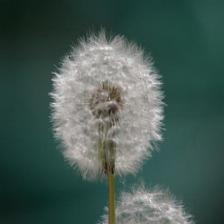

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


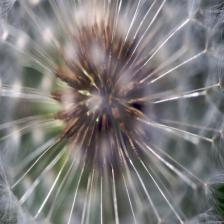

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


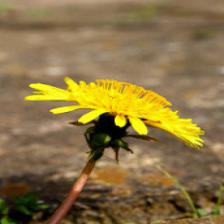

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


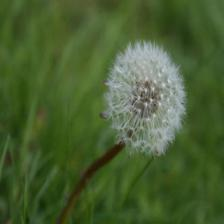

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


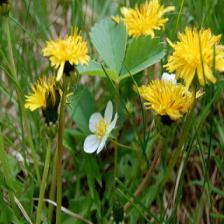

Actual    : dandelion
Predicted : dandelion
Confidence: 98.17%
----------------------------------------


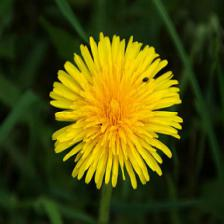

Actual    : dandelion
Predicted : dandelion
Confidence: 99.90%
----------------------------------------


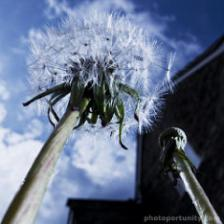

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


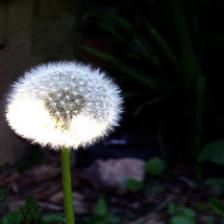

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


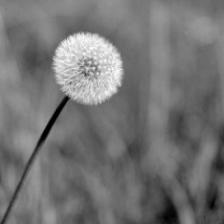

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


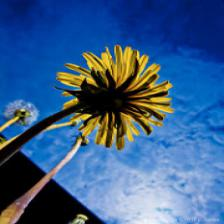

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


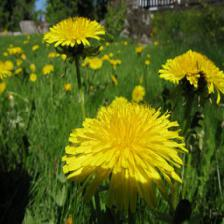

Actual    : dandelion
Predicted : dandelion
Confidence: 99.96%
----------------------------------------


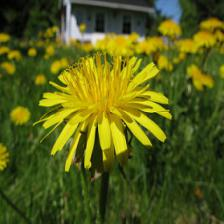

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


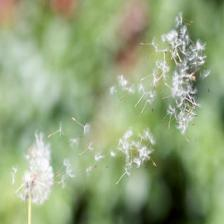

Actual    : dandelion
Predicted : dandelion
Confidence: 99.82%
----------------------------------------


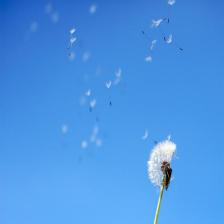

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


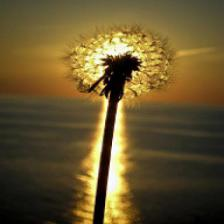

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


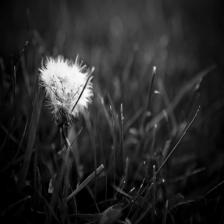

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


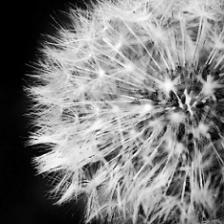

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


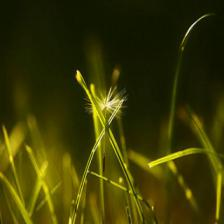

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


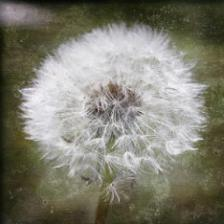

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


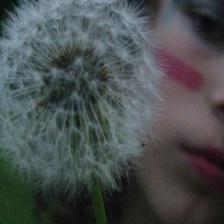

Actual    : dandelion
Predicted : dandelion
Confidence: 99.82%
----------------------------------------


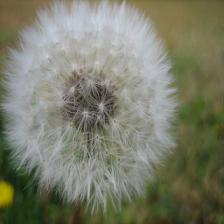

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


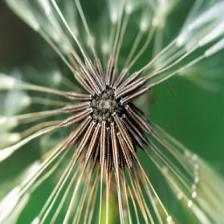

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


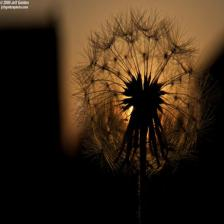

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


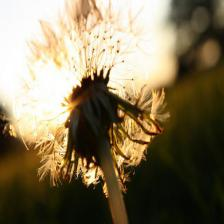

Actual    : dandelion
Predicted : dandelion
Confidence: 99.96%
----------------------------------------


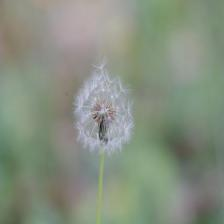

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


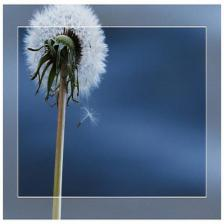

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


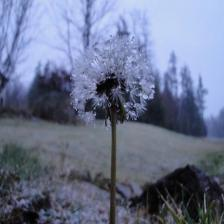

Actual    : dandelion
Predicted : dandelion
Confidence: 99.76%
----------------------------------------


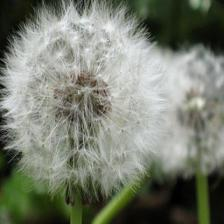

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


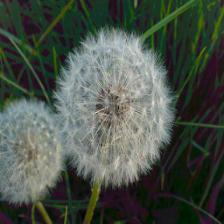

Actual    : dandelion
Predicted : dandelion
Confidence: 99.89%
----------------------------------------


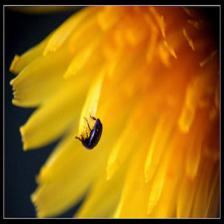

Actual    : dandelion
Predicted : daisy
Confidence: 99.27%
----------------------------------------


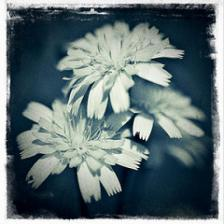

Actual    : dandelion
Predicted : dandelion
Confidence: 97.47%
----------------------------------------


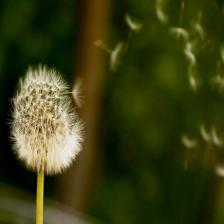

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


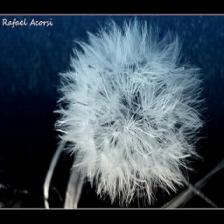

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


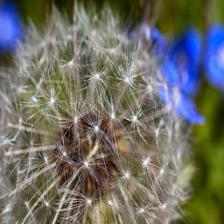

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


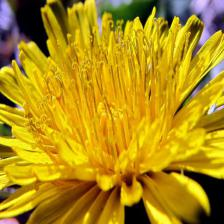

Actual    : dandelion
Predicted : dandelion
Confidence: 99.63%
----------------------------------------


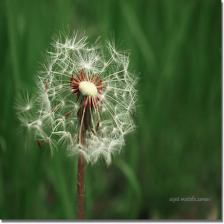

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


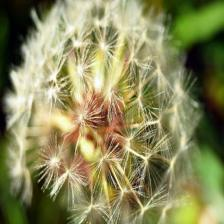

Actual    : dandelion
Predicted : dandelion
Confidence: 99.64%
----------------------------------------


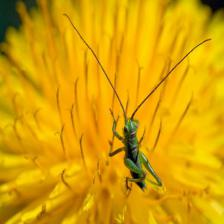

Actual    : dandelion
Predicted : dandelion
Confidence: 99.85%
----------------------------------------


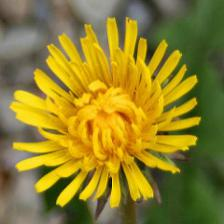

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


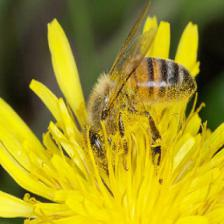

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


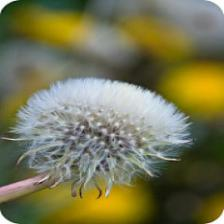

Actual    : dandelion
Predicted : dandelion
Confidence: 99.85%
----------------------------------------


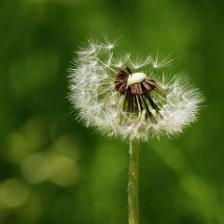

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


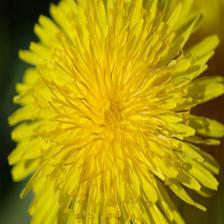

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


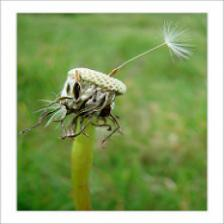

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


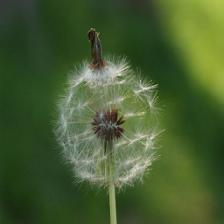

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


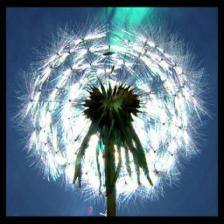

Actual    : dandelion
Predicted : dandelion
Confidence: 99.95%
----------------------------------------


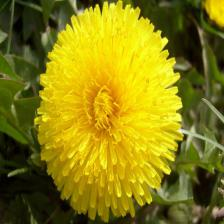

Actual    : dandelion
Predicted : daisy
Confidence: 85.50%
----------------------------------------


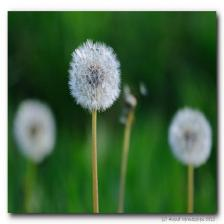

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


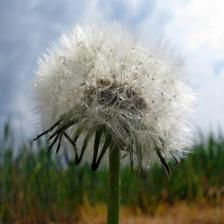

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


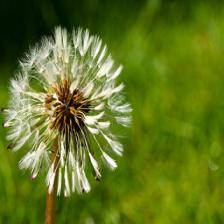

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


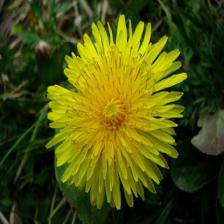

Actual    : dandelion
Predicted : dandelion
Confidence: 98.66%
----------------------------------------


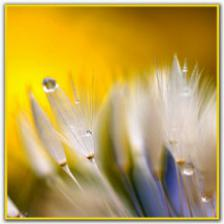

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


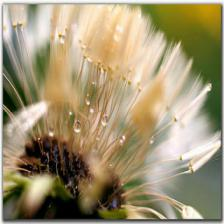

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


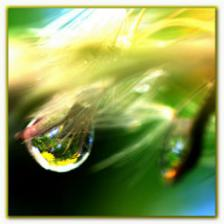

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


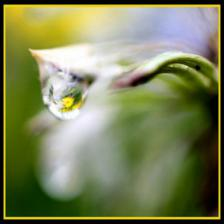

Actual    : dandelion
Predicted : dandelion
Confidence: 99.77%
----------------------------------------


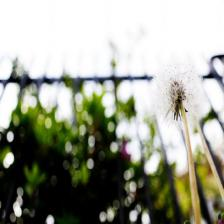

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


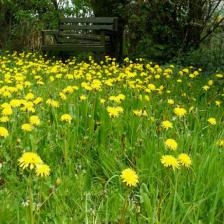

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


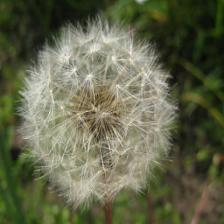

Actual    : dandelion
Predicted : dandelion
Confidence: 99.97%
----------------------------------------


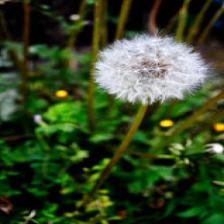

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


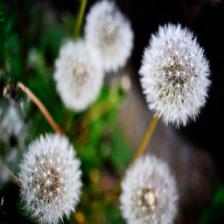

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


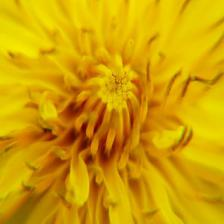

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


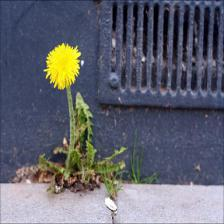

Actual    : dandelion
Predicted : dandelion
Confidence: 99.03%
----------------------------------------


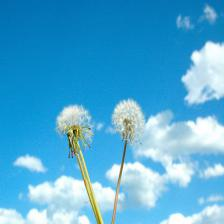

Actual    : dandelion
Predicted : dandelion
Confidence: 99.99%
----------------------------------------


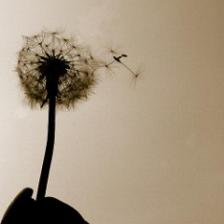

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


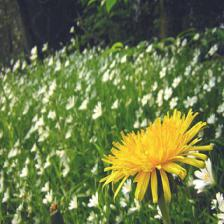

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


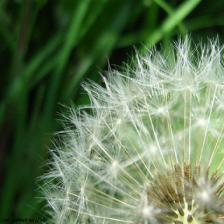

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


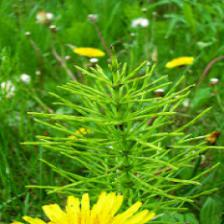

Actual    : dandelion
Predicted : dandelion
Confidence: 93.84%
----------------------------------------


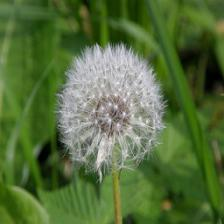

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


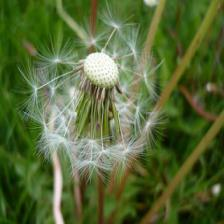

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


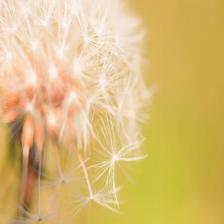

Actual    : dandelion
Predicted : dandelion
Confidence: 99.78%
----------------------------------------


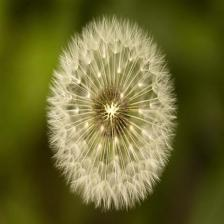

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


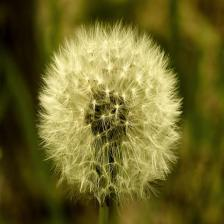

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


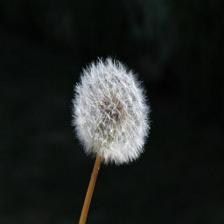

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


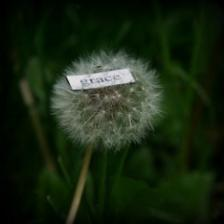

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


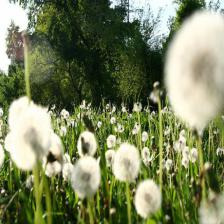

Actual    : dandelion
Predicted : dandelion
Confidence: 99.96%
----------------------------------------


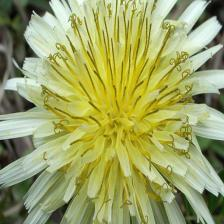

Actual    : dandelion
Predicted : dandelion
Confidence: 99.95%
----------------------------------------


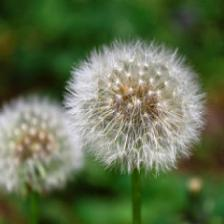

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


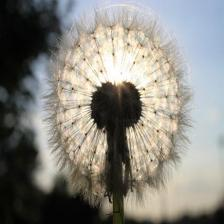

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


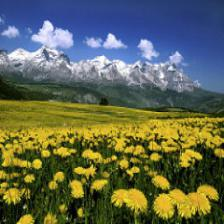

Actual    : dandelion
Predicted : dandelion
Confidence: 98.87%
----------------------------------------


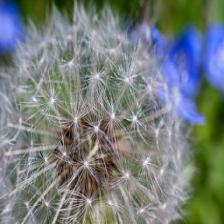

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


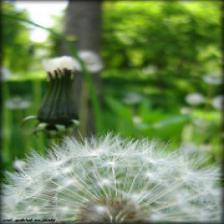

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


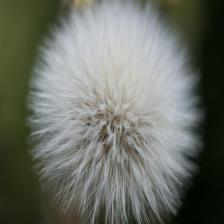

Actual    : dandelion
Predicted : dandelion
Confidence: 97.15%
----------------------------------------


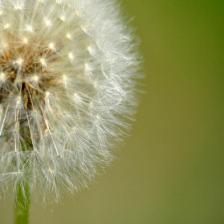

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


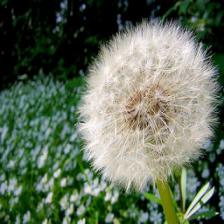

Actual    : dandelion
Predicted : dandelion
Confidence: 99.92%
----------------------------------------


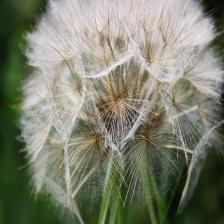

Actual    : dandelion
Predicted : dandelion
Confidence: 99.95%
----------------------------------------


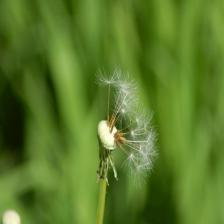

Actual    : dandelion
Predicted : dandelion
Confidence: 99.98%
----------------------------------------


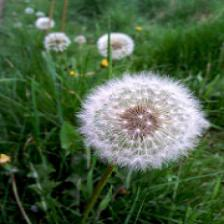

Actual    : dandelion
Predicted : dandelion
Confidence: 100.00%
----------------------------------------


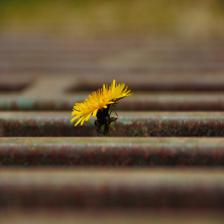

Actual    : dandelion
Predicted : dandelion
Confidence: 99.39%
----------------------------------------


<div><progress max="1" value="0"></progress> 0.00% [0/1 00:00&lt;?]</div>

In [ ]:
import glob
from IPython.display import Image as IPImage, display

daisy_images = glob.glob(r'D:\DOWNLOAD FOLDER\Flowers_Classification.v4-youtube.folder\test\daisy\*.jpg')
dandelion_images = glob.glob(r'D:\DOWNLOAD FOLDER\Flowers_Classification.v4-youtube.folder\train\dandelion\*.jpg')

test_images = daisy_images + dandelion_images

for imageName in test_images:
    actual = 'daisy' if 'daisy' in imageName else 'dandelion'
    img = PILImage.create(imageName)
    pred_class, pred_idx, probs = learn.predict(img)
    confidence = probs[pred_idx] * 100

    display(IPImage(filename=imageName, width=200))
    print(f'Actual    : {actual}')
    print(f'Predicted : {pred_class}')
    print(f'Confidence: {confidence:.2f}%')
    print('-' * 40)